<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Parameters" data-toc-modified-id="Parameters-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Parameters</a></span></li><li><span><a href="#Data" data-toc-modified-id="Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data</a></span></li><li><span><a href="#Generator" data-toc-modified-id="Generator-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Generator</a></span></li><li><span><a href="#Discriminator" data-toc-modified-id="Discriminator-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Discriminator</a></span></li><li><span><a href="#Loss-func" data-toc-modified-id="Loss-func-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Loss func</a></span></li><li><span><a href="#Training-Loop" data-toc-modified-id="Training-Loop-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Training Loop</a></span></li></ul></div>

In [1]:
import argparse
import os
import random

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from IPython.display import HTML

In [2]:
random.seed(999)
torch.manual_seed(999)

# Parameters
- dataroot : root directory
- workers : no of threads for dataloader
- batch_size 
- image_size 
- nc : no of channels in input 
- nz : Size of generator input
- ngf : Size of feature maps in generator
- ndf : Size of feature maps in discriminator
- max_epochs=5
- lr : Learning rate
- beta1 : Parameter for ADAM
- ngpu : No of GPUs

In [3]:
dataroot = "retinal"
workers = 2
batch_size = 256
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 5000
lr = .0002
beta1 = .5
ngpu = 1
# num_epochs = 10000
# lr = .0005
# beta1 = .6

# Data

In [4]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((.5, .5, .5),
                                                    (.5, .5, .5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset,
                                         batch_size=batch_size,
                                         shuffle=True,
                                         num_workers=workers)

In [5]:
device = torch.device("cuda")

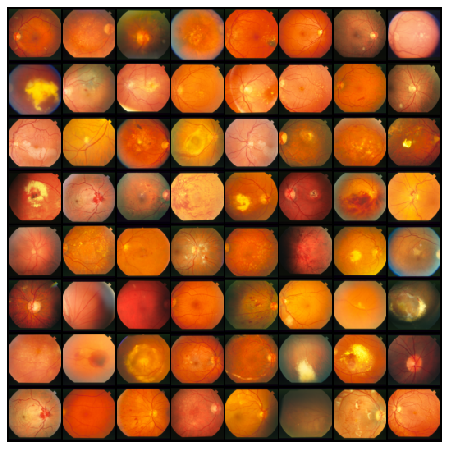

In [6]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch[0].to(device)[:64],
                         padding=2,
                         normalize=True).cpu(), (1, 2, 0)))

In [7]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, .02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, .02)
        nn.init.constant_(m.bias.data, 0)

# Generator

In [8]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [9]:
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Discriminator

In [10]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid())

    def forward(self, input):
        return self.main(input)

In [11]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Loss func

In [12]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

In [13]:
img_list = []
G_losses = []
D_losses = []
iters = 0

In [14]:
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size, ), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print(
                '[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                % (epoch, num_epochs, i, len(dataloader), errD.item(),
                   errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs - 1) and
                                  (i == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

[0/5000][0/2]	Loss_D: 1.6477	Loss_G: 6.1797	D(x): 0.7591	D(G(z)): 0.6682 / 0.0037
[1/5000][0/2]	Loss_D: 0.1973	Loss_G: 6.9934	D(x): 0.9841	D(G(z)): 0.1426 / 0.0016
[2/5000][0/2]	Loss_D: 0.1710	Loss_G: 7.1532	D(x): 0.9820	D(G(z)): 0.1288 / 0.0013
[3/5000][0/2]	Loss_D: 0.0979	Loss_G: 7.9484	D(x): 0.9870	D(G(z)): 0.0775 / 0.0006
[4/5000][0/2]	Loss_D: 0.1164	Loss_G: 8.9704	D(x): 0.9921	D(G(z)): 0.0967 / 0.0002
[5/5000][0/2]	Loss_D: 0.0515	Loss_G: 8.0775	D(x): 0.9941	D(G(z)): 0.0434 / 0.0005
[6/5000][0/2]	Loss_D: 0.0219	Loss_G: 9.0842	D(x): 0.9915	D(G(z)): 0.0128 / 0.0002
[7/5000][0/2]	Loss_D: 0.0812	Loss_G: 11.0421	D(x): 0.9967	D(G(z)): 0.0727 / 0.0000
[8/5000][0/2]	Loss_D: 0.0272	Loss_G: 8.3664	D(x): 0.9970	D(G(z)): 0.0236 / 0.0003
[9/5000][0/2]	Loss_D: 0.0246	Loss_G: 15.9319	D(x): 0.9770	D(G(z)): 0.0001 / 0.0000
[10/5000][0/2]	Loss_D: 0.0127	Loss_G: 6.9011	D(x): 0.9991	D(G(z)): 0.0117 / 0.0014
[11/5000][0/2]	Loss_D: 0.1774	Loss_G: 26.8030	D(x): 0.8676	D(G(z)): 0.0000 / 0.0000
[12/5000][0

[98/5000][0/2]	Loss_D: 0.0192	Loss_G: 7.1816	D(x): 0.9906	D(G(z)): 0.0010 / 0.0010
[99/5000][0/2]	Loss_D: 0.6395	Loss_G: 9.4021	D(x): 0.9974	D(G(z)): 0.4493 / 0.0002
[100/5000][0/2]	Loss_D: 0.1168	Loss_G: 7.4557	D(x): 0.9293	D(G(z)): 0.0030 / 0.0018
[101/5000][0/2]	Loss_D: 1.1611	Loss_G: 16.3522	D(x): 0.9920	D(G(z)): 0.5692 / 0.0000
[102/5000][0/2]	Loss_D: 0.0256	Loss_G: 3.2118	D(x): 0.9876	D(G(z)): 0.0098 / 0.1122
[103/5000][0/2]	Loss_D: 1.7988	Loss_G: 7.4712	D(x): 0.3758	D(G(z)): 0.0005 / 0.0024
[104/5000][0/2]	Loss_D: 4.1122	Loss_G: 16.2878	D(x): 0.9892	D(G(z)): 0.9152 / 0.0000
[105/5000][0/2]	Loss_D: 0.7823	Loss_G: 5.8948	D(x): 0.5566	D(G(z)): 0.0005 / 0.0037
[106/5000][0/2]	Loss_D: 0.6969	Loss_G: 3.0402	D(x): 0.9973	D(G(z)): 0.4792 / 0.0614
[107/5000][0/2]	Loss_D: 0.3566	Loss_G: 5.5104	D(x): 0.7861	D(G(z)): 0.0380 / 0.0052
[108/5000][0/2]	Loss_D: 3.3611	Loss_G: 17.2167	D(x): 0.9573	D(G(z)): 0.9521 / 0.0000
[109/5000][0/2]	Loss_D: 2.9129	Loss_G: 4.2159	D(x): 0.1030	D(G(z)): 0.0009 

[196/5000][0/2]	Loss_D: 1.6984	Loss_G: 0.8618	D(x): 0.2640	D(G(z)): 0.0043 / 0.4545
[197/5000][0/2]	Loss_D: 2.0991	Loss_G: 5.8530	D(x): 0.1990	D(G(z)): 0.0005 / 0.0051
[198/5000][0/2]	Loss_D: 1.0119	Loss_G: 2.7361	D(x): 0.9853	D(G(z)): 0.5932 / 0.0824
[199/5000][0/2]	Loss_D: 0.3602	Loss_G: 2.9055	D(x): 0.7996	D(G(z)): 0.0998 / 0.0702
[200/5000][0/2]	Loss_D: 0.4934	Loss_G: 2.6529	D(x): 0.8651	D(G(z)): 0.2755 / 0.0853
[201/5000][0/2]	Loss_D: 0.5107	Loss_G: 2.5941	D(x): 0.6988	D(G(z)): 0.0805 / 0.0948
[202/5000][0/2]	Loss_D: 0.4225	Loss_G: 3.4508	D(x): 0.7127	D(G(z)): 0.0347 / 0.0398
[203/5000][0/2]	Loss_D: 0.3623	Loss_G: 4.0431	D(x): 0.9210	D(G(z)): 0.2313 / 0.0217
[204/5000][0/2]	Loss_D: 0.8366	Loss_G: 6.6056	D(x): 0.9654	D(G(z)): 0.5259 / 0.0021
[205/5000][0/2]	Loss_D: 1.4380	Loss_G: 6.9247	D(x): 0.9976	D(G(z)): 0.7164 / 0.0014
[206/5000][0/2]	Loss_D: 0.1561	Loss_G: 2.8450	D(x): 0.9518	D(G(z)): 0.0973 / 0.0762
[207/5000][0/2]	Loss_D: 0.2073	Loss_G: 4.7473	D(x): 0.8951	D(G(z)): 0.0784 /

[294/5000][0/2]	Loss_D: 1.0182	Loss_G: 0.5938	D(x): 0.5458	D(G(z)): 0.1256 / 0.6609
[295/5000][0/2]	Loss_D: 0.4483	Loss_G: 3.1494	D(x): 0.7715	D(G(z)): 0.1235 / 0.0519
[296/5000][0/2]	Loss_D: 0.3602	Loss_G: 2.1120	D(x): 0.8408	D(G(z)): 0.1491 / 0.1413
[297/5000][0/2]	Loss_D: 0.4027	Loss_G: 2.5761	D(x): 0.8026	D(G(z)): 0.1337 / 0.0892
[298/5000][0/2]	Loss_D: 0.4982	Loss_G: 3.5384	D(x): 0.8107	D(G(z)): 0.2255 / 0.0363
[299/5000][0/2]	Loss_D: 0.8561	Loss_G: 5.7712	D(x): 0.9306	D(G(z)): 0.4983 / 0.0043
[300/5000][0/2]	Loss_D: 0.6246	Loss_G: 3.8169	D(x): 0.9221	D(G(z)): 0.3547 / 0.0586
[301/5000][0/2]	Loss_D: 0.4431	Loss_G: 3.4959	D(x): 0.8947	D(G(z)): 0.2624 / 0.0388
[302/5000][0/2]	Loss_D: 0.6476	Loss_G: 3.8838	D(x): 0.9405	D(G(z)): 0.4120 / 0.0263
[303/5000][0/2]	Loss_D: 0.3632	Loss_G: 2.3789	D(x): 0.8227	D(G(z)): 0.1374 / 0.1192
[304/5000][0/2]	Loss_D: 2.1232	Loss_G: 1.2952	D(x): 0.1997	D(G(z)): 0.0082 / 0.3297
[305/5000][0/2]	Loss_D: 0.3685	Loss_G: 4.4919	D(x): 0.8369	D(G(z)): 0.1408 /

[392/5000][0/2]	Loss_D: 1.4757	Loss_G: 6.9818	D(x): 0.9836	D(G(z)): 0.7331 / 0.0023
[393/5000][0/2]	Loss_D: 0.2570	Loss_G: 2.6203	D(x): 0.8453	D(G(z)): 0.0600 / 0.1016
[394/5000][0/2]	Loss_D: 0.2465	Loss_G: 4.0042	D(x): 0.9122	D(G(z)): 0.1235 / 0.0246
[395/5000][0/2]	Loss_D: 0.6262	Loss_G: 4.1547	D(x): 0.9626	D(G(z)): 0.4109 / 0.0241
[396/5000][0/2]	Loss_D: 0.3998	Loss_G: 2.4240	D(x): 0.8237	D(G(z)): 0.1592 / 0.1134
[397/5000][0/2]	Loss_D: 0.8646	Loss_G: 1.4310	D(x): 0.5224	D(G(z)): 0.0353 / 0.2999
[398/5000][0/2]	Loss_D: 0.7878	Loss_G: 3.4580	D(x): 0.5355	D(G(z)): 0.0189 / 0.0537
[399/5000][0/2]	Loss_D: 0.4195	Loss_G: 4.8081	D(x): 0.9454	D(G(z)): 0.2812 / 0.0117
[400/5000][0/2]	Loss_D: 0.6242	Loss_G: 4.9747	D(x): 0.9233	D(G(z)): 0.3834 / 0.0108
[401/5000][0/2]	Loss_D: 0.3004	Loss_G: 2.9545	D(x): 0.8906	D(G(z)): 0.1584 / 0.0702
[402/5000][0/2]	Loss_D: 0.3031	Loss_G: 3.4759	D(x): 0.8741	D(G(z)): 0.1462 / 0.0402
[403/5000][0/2]	Loss_D: 1.5041	Loss_G: 5.6939	D(x): 0.9695	D(G(z)): 0.7250 /

[490/5000][0/2]	Loss_D: 0.3780	Loss_G: 3.0020	D(x): 0.8456	D(G(z)): 0.1747 / 0.0639
[491/5000][0/2]	Loss_D: 1.1499	Loss_G: 5.0977	D(x): 0.9709	D(G(z)): 0.6296 / 0.0087
[492/5000][0/2]	Loss_D: 0.4265	Loss_G: 2.5592	D(x): 0.9610	D(G(z)): 0.3010 / 0.0971
[493/5000][0/2]	Loss_D: 0.9072	Loss_G: 1.5975	D(x): 0.4625	D(G(z)): 0.0357 / 0.2381
[494/5000][0/2]	Loss_D: 0.3010	Loss_G: 4.0218	D(x): 0.8545	D(G(z)): 0.1234 / 0.0240
[495/5000][0/2]	Loss_D: 1.0730	Loss_G: 4.6212	D(x): 0.9774	D(G(z)): 0.6143 / 0.0143
[496/5000][0/2]	Loss_D: 0.9068	Loss_G: 3.9807	D(x): 0.9242	D(G(z)): 0.5187 / 0.0420
[497/5000][0/2]	Loss_D: 0.7659	Loss_G: 1.1910	D(x): 0.5830	D(G(z)): 0.1281 / 0.3546
[498/5000][0/2]	Loss_D: 0.4170	Loss_G: 3.8476	D(x): 0.7065	D(G(z)): 0.0416 / 0.0314
[499/5000][0/2]	Loss_D: 0.9439	Loss_G: 3.7766	D(x): 0.9850	D(G(z)): 0.5592 / 0.0321
[500/5000][0/2]	Loss_D: 0.4057	Loss_G: 2.9512	D(x): 0.9457	D(G(z)): 0.2692 / 0.0696
[501/5000][0/2]	Loss_D: 0.4273	Loss_G: 2.9067	D(x): 0.9281	D(G(z)): 0.2835 /

[588/5000][0/2]	Loss_D: 2.3264	Loss_G: 0.8393	D(x): 0.1442	D(G(z)): 0.0214 / 0.4845
[589/5000][0/2]	Loss_D: 0.7006	Loss_G: 2.1874	D(x): 0.6245	D(G(z)): 0.1261 / 0.1740
[590/5000][0/2]	Loss_D: 0.4026	Loss_G: 3.4783	D(x): 0.7240	D(G(z)): 0.0409 / 0.0460
[591/5000][0/2]	Loss_D: 1.0973	Loss_G: 4.5867	D(x): 0.9692	D(G(z)): 0.6237 / 0.0189
[592/5000][0/2]	Loss_D: 0.3025	Loss_G: 3.8936	D(x): 0.7713	D(G(z)): 0.0235 / 0.0327
[593/5000][0/2]	Loss_D: 0.8937	Loss_G: 2.8736	D(x): 0.9726	D(G(z)): 0.5299 / 0.0809
[594/5000][0/2]	Loss_D: 1.4844	Loss_G: 0.4972	D(x): 0.2866	D(G(z)): 0.0920 / 0.6336
[595/5000][0/2]	Loss_D: 0.3313	Loss_G: 4.0384	D(x): 0.9154	D(G(z)): 0.2086 / 0.0244
[596/5000][0/2]	Loss_D: 1.3041	Loss_G: 2.8714	D(x): 0.9362	D(G(z)): 0.6691 / 0.0722
[597/5000][0/2]	Loss_D: 1.3270	Loss_G: 1.4256	D(x): 0.3529	D(G(z)): 0.0332 / 0.2895
[598/5000][0/2]	Loss_D: 0.4943	Loss_G: 4.0839	D(x): 0.9762	D(G(z)): 0.3502 / 0.0239
[599/5000][0/2]	Loss_D: 0.5703	Loss_G: 2.5346	D(x): 0.9804	D(G(z)): 0.3963 /

[686/5000][0/2]	Loss_D: 1.0488	Loss_G: 3.1022	D(x): 0.9963	D(G(z)): 0.6113 / 0.0590
[687/5000][0/2]	Loss_D: 0.1272	Loss_G: 3.8872	D(x): 0.9474	D(G(z)): 0.0684 / 0.0281
[688/5000][0/2]	Loss_D: 1.3268	Loss_G: 4.0737	D(x): 0.9969	D(G(z)): 0.6835 / 0.0229
[689/5000][0/2]	Loss_D: 0.7258	Loss_G: 2.7334	D(x): 0.9467	D(G(z)): 0.4566 / 0.0835
[690/5000][0/2]	Loss_D: 1.7432	Loss_G: 0.7253	D(x): 0.2201	D(G(z)): 0.0352 / 0.5180
[691/5000][0/2]	Loss_D: 0.6187	Loss_G: 2.6757	D(x): 0.6321	D(G(z)): 0.1157 / 0.0900
[692/5000][0/2]	Loss_D: 0.1709	Loss_G: 3.5745	D(x): 0.9603	D(G(z)): 0.1178 / 0.0371
[693/5000][0/2]	Loss_D: 0.3547	Loss_G: 2.4076	D(x): 0.9883	D(G(z)): 0.2744 / 0.1073
[694/5000][0/2]	Loss_D: 0.4394	Loss_G: 3.1798	D(x): 0.9928	D(G(z)): 0.3392 / 0.0569
[695/5000][0/2]	Loss_D: 0.1816	Loss_G: 2.8483	D(x): 0.9752	D(G(z)): 0.1416 / 0.0683
[696/5000][0/2]	Loss_D: 0.5844	Loss_G: 1.5159	D(x): 0.7236	D(G(z)): 0.2081 / 0.2548
[697/5000][0/2]	Loss_D: 0.1327	Loss_G: 4.0646	D(x): 0.9617	D(G(z)): 0.0872 /

[784/5000][0/2]	Loss_D: 0.2379	Loss_G: 3.3015	D(x): 0.9546	D(G(z)): 0.1675 / 0.0461
[785/5000][0/2]	Loss_D: 0.6984	Loss_G: 3.4152	D(x): 0.8834	D(G(z)): 0.4143 / 0.0424
[786/5000][0/2]	Loss_D: 0.1533	Loss_G: 4.4887	D(x): 0.8812	D(G(z)): 0.0239 / 0.0156
[787/5000][0/2]	Loss_D: 0.8505	Loss_G: 3.7577	D(x): 0.9957	D(G(z)): 0.5308 / 0.0322
[788/5000][0/2]	Loss_D: 0.7697	Loss_G: 3.1931	D(x): 0.9409	D(G(z)): 0.4491 / 0.0709
[789/5000][0/2]	Loss_D: 0.8789	Loss_G: 2.2353	D(x): 0.4678	D(G(z)): 0.0226 / 0.1342
[790/5000][0/2]	Loss_D: 0.2249	Loss_G: 4.1690	D(x): 0.9884	D(G(z)): 0.1838 / 0.0204
[791/5000][0/2]	Loss_D: 0.9315	Loss_G: 3.1387	D(x): 0.9981	D(G(z)): 0.5737 / 0.0621
[792/5000][0/2]	Loss_D: 0.1924	Loss_G: 3.6391	D(x): 0.9153	D(G(z)): 0.0957 / 0.0340
[793/5000][0/2]	Loss_D: 1.1553	Loss_G: 4.3289	D(x): 0.9970	D(G(z)): 0.6530 / 0.0245
[794/5000][0/2]	Loss_D: 0.5458	Loss_G: 3.0677	D(x): 0.9828	D(G(z)): 0.3668 / 0.0661
[795/5000][0/2]	Loss_D: 0.5418	Loss_G: 2.5184	D(x): 0.7999	D(G(z)): 0.2382 /

[882/5000][0/2]	Loss_D: 0.3567	Loss_G: 2.5086	D(x): 0.9908	D(G(z)): 0.2763 / 0.1009
[883/5000][0/2]	Loss_D: 0.2957	Loss_G: 2.8242	D(x): 0.9085	D(G(z)): 0.1732 / 0.0765
[884/5000][0/2]	Loss_D: 0.0977	Loss_G: 4.1194	D(x): 0.9598	D(G(z)): 0.0538 / 0.0220
[885/5000][0/2]	Loss_D: 0.2480	Loss_G: 2.2634	D(x): 0.9239	D(G(z)): 0.1507 / 0.1281
[886/5000][0/2]	Loss_D: 0.1392	Loss_G: 3.6029	D(x): 0.9821	D(G(z)): 0.1120 / 0.0354
[887/5000][0/2]	Loss_D: 0.9233	Loss_G: 3.5440	D(x): 0.9811	D(G(z)): 0.5489 / 0.0478
[888/5000][0/2]	Loss_D: 0.3803	Loss_G: 3.1022	D(x): 0.7133	D(G(z)): 0.0235 / 0.0598
[889/5000][0/2]	Loss_D: 0.7934	Loss_G: 4.4853	D(x): 0.9971	D(G(z)): 0.4968 / 0.0171
[890/5000][0/2]	Loss_D: 0.5926	Loss_G: 3.6661	D(x): 0.9965	D(G(z)): 0.3906 / 0.0433
[891/5000][0/2]	Loss_D: 0.1112	Loss_G: 3.7178	D(x): 0.9791	D(G(z)): 0.0836 / 0.0348
[892/5000][0/2]	Loss_D: 0.1118	Loss_G: 3.0469	D(x): 0.9910	D(G(z)): 0.0956 / 0.0630
[893/5000][0/2]	Loss_D: 0.2863	Loss_G: 2.9635	D(x): 0.9010	D(G(z)): 0.1570 /

[980/5000][0/2]	Loss_D: 0.1548	Loss_G: 3.7274	D(x): 0.9750	D(G(z)): 0.1168 / 0.0319
[981/5000][0/2]	Loss_D: 0.4105	Loss_G: 3.4911	D(x): 0.9904	D(G(z)): 0.3111 / 0.0434
[982/5000][0/2]	Loss_D: 0.1497	Loss_G: 3.3433	D(x): 0.9818	D(G(z)): 0.1169 / 0.0472
[983/5000][0/2]	Loss_D: 0.1232	Loss_G: 3.2823	D(x): 0.9839	D(G(z)): 0.0990 / 0.0492
[984/5000][0/2]	Loss_D: 0.2402	Loss_G: 3.1459	D(x): 0.9680	D(G(z)): 0.1768 / 0.0531
[985/5000][0/2]	Loss_D: 0.0795	Loss_G: 4.3009	D(x): 0.9532	D(G(z)): 0.0303 / 0.0166
[986/5000][0/2]	Loss_D: 0.4660	Loss_G: 2.6621	D(x): 0.9946	D(G(z)): 0.3446 / 0.0932
[987/5000][0/2]	Loss_D: 0.1403	Loss_G: 3.5491	D(x): 0.9525	D(G(z)): 0.0855 / 0.0355
[988/5000][0/2]	Loss_D: 0.1635	Loss_G: 3.1146	D(x): 0.9869	D(G(z)): 0.1338 / 0.0599
[989/5000][0/2]	Loss_D: 0.0942	Loss_G: 3.6611	D(x): 0.9747	D(G(z)): 0.0652 / 0.0329
[990/5000][0/2]	Loss_D: 0.0703	Loss_G: 3.8280	D(x): 0.9736	D(G(z)): 0.0421 / 0.0300
[991/5000][0/2]	Loss_D: 0.5910	Loss_G: 3.4155	D(x): 0.9821	D(G(z)): 0.4109 /

[1077/5000][0/2]	Loss_D: 0.8816	Loss_G: 3.4199	D(x): 0.9959	D(G(z)): 0.5413 / 0.0500
[1078/5000][0/2]	Loss_D: 0.2220	Loss_G: 5.3629	D(x): 0.8182	D(G(z)): 0.0118 / 0.0087
[1079/5000][0/2]	Loss_D: 1.5939	Loss_G: 6.5372	D(x): 0.9996	D(G(z)): 0.7224 / 0.0036
[1080/5000][0/2]	Loss_D: 0.6057	Loss_G: 3.3381	D(x): 0.9773	D(G(z)): 0.4062 / 0.0515
[1081/5000][0/2]	Loss_D: 0.6954	Loss_G: 3.8258	D(x): 0.5549	D(G(z)): 0.0233 / 0.0550
[1082/5000][0/2]	Loss_D: 0.5748	Loss_G: 3.3553	D(x): 0.9826	D(G(z)): 0.3948 / 0.0521
[1083/5000][0/2]	Loss_D: 0.4353	Loss_G: 3.7388	D(x): 0.6970	D(G(z)): 0.0291 / 0.0570
[1084/5000][0/2]	Loss_D: 0.4771	Loss_G: 3.8353	D(x): 0.9320	D(G(z)): 0.3052 / 0.0289
[1085/5000][0/2]	Loss_D: 0.4528	Loss_G: 3.5304	D(x): 0.6880	D(G(z)): 0.0347 / 0.0655
[1086/5000][0/2]	Loss_D: 0.2639	Loss_G: 3.5763	D(x): 0.8443	D(G(z)): 0.0821 / 0.0340
[1087/5000][0/2]	Loss_D: 0.2339	Loss_G: 3.0587	D(x): 0.9199	D(G(z)): 0.1320 / 0.0757
[1088/5000][0/2]	Loss_D: 0.2416	Loss_G: 3.0916	D(x): 0.8925	D(G(z

[1174/5000][0/2]	Loss_D: 1.2474	Loss_G: 6.8112	D(x): 0.9985	D(G(z)): 0.6409 / 0.0072
[1175/5000][0/2]	Loss_D: 1.0268	Loss_G: 4.0269	D(x): 0.9967	D(G(z)): 0.5921 / 0.0313
[1176/5000][0/2]	Loss_D: 0.8344	Loss_G: 4.3091	D(x): 0.9657	D(G(z)): 0.4784 / 0.0409
[1177/5000][0/2]	Loss_D: 0.3366	Loss_G: 2.8505	D(x): 0.8147	D(G(z)): 0.1054 / 0.0918
[1178/5000][0/2]	Loss_D: 0.5410	Loss_G: 3.8219	D(x): 0.8192	D(G(z)): 0.2640 / 0.0370
[1179/5000][0/2]	Loss_D: 0.3770	Loss_G: 2.4935	D(x): 0.7656	D(G(z)): 0.0806 / 0.1075
[1180/5000][0/2]	Loss_D: 0.1867	Loss_G: 4.1305	D(x): 0.9531	D(G(z)): 0.1183 / 0.0231
[1181/5000][0/2]	Loss_D: 0.1758	Loss_G: 3.2967	D(x): 0.9002	D(G(z)): 0.0651 / 0.0490
[1182/5000][0/2]	Loss_D: 0.2349	Loss_G: 3.0058	D(x): 0.8975	D(G(z)): 0.1152 / 0.0588
[1183/5000][0/2]	Loss_D: 0.1162	Loss_G: 4.6230	D(x): 0.9080	D(G(z)): 0.0181 / 0.0128
[1184/5000][0/2]	Loss_D: 0.0710	Loss_G: 3.4328	D(x): 0.9880	D(G(z)): 0.0560 / 0.0434
[1185/5000][0/2]	Loss_D: 0.3732	Loss_G: 3.6546	D(x): 0.9974	D(G(z

[1271/5000][0/2]	Loss_D: 0.3865	Loss_G: 3.1032	D(x): 0.7225	D(G(z)): 0.0323 / 0.0856
[1272/5000][0/2]	Loss_D: 0.0949	Loss_G: 4.2739	D(x): 0.9917	D(G(z)): 0.0807 / 0.0199
[1273/5000][0/2]	Loss_D: 0.2927	Loss_G: 3.5268	D(x): 0.9960	D(G(z)): 0.2293 / 0.0394
[1274/5000][0/2]	Loss_D: 0.0789	Loss_G: 4.1540	D(x): 0.9875	D(G(z)): 0.0620 / 0.0219
[1275/5000][0/2]	Loss_D: 0.0541	Loss_G: 4.2575	D(x): 0.9832	D(G(z)): 0.0352 / 0.0192
[1276/5000][0/2]	Loss_D: 0.3817	Loss_G: 3.0750	D(x): 0.9942	D(G(z)): 0.2923 / 0.0617
[1277/5000][0/2]	Loss_D: 0.0511	Loss_G: 4.7961	D(x): 0.9873	D(G(z)): 0.0351 / 0.0112
[1278/5000][0/2]	Loss_D: 0.7074	Loss_G: 5.3890	D(x): 0.9837	D(G(z)): 0.4514 / 0.0083
[1279/5000][0/2]	Loss_D: 0.5542	Loss_G: 1.9457	D(x): 0.6150	D(G(z)): 0.0104 / 0.1755
[1280/5000][0/2]	Loss_D: 0.2067	Loss_G: 4.1373	D(x): 0.9985	D(G(z)): 0.1756 / 0.0221
[1281/5000][0/2]	Loss_D: 0.0504	Loss_G: 4.4268	D(x): 0.9951	D(G(z)): 0.0438 / 0.0159
[1282/5000][0/2]	Loss_D: 0.1431	Loss_G: 3.2962	D(x): 0.9018	D(G(z

[1368/5000][0/2]	Loss_D: 0.0378	Loss_G: 5.1864	D(x): 0.9906	D(G(z)): 0.0275 / 0.0083
[1369/5000][0/2]	Loss_D: 0.1083	Loss_G: 4.0815	D(x): 0.9272	D(G(z)): 0.0212 / 0.0282
[1370/5000][0/2]	Loss_D: 0.0418	Loss_G: 4.1134	D(x): 0.9954	D(G(z)): 0.0361 / 0.0240
[1371/5000][0/2]	Loss_D: 0.0342	Loss_G: 4.2846	D(x): 0.9964	D(G(z)): 0.0299 / 0.0185
[1372/5000][0/2]	Loss_D: 0.1871	Loss_G: 3.0923	D(x): 0.9993	D(G(z)): 0.1606 / 0.0610
[1373/5000][0/2]	Loss_D: 0.0518	Loss_G: 4.5049	D(x): 0.9959	D(G(z)): 0.0447 / 0.0152
[1374/5000][0/2]	Loss_D: 0.0184	Loss_G: 5.2022	D(x): 0.9944	D(G(z)): 0.0127 / 0.0080
[1375/5000][0/2]	Loss_D: 0.1749	Loss_G: 2.8756	D(x): 0.9989	D(G(z)): 0.1524 / 0.0746
[1376/5000][0/2]	Loss_D: 0.0538	Loss_G: 4.4238	D(x): 0.9972	D(G(z)): 0.0489 / 0.0160
[1377/5000][0/2]	Loss_D: 0.0203	Loss_G: 4.9620	D(x): 0.9938	D(G(z)): 0.0140 / 0.0091
[1378/5000][0/2]	Loss_D: 0.2108	Loss_G: 3.3726	D(x): 0.9992	D(G(z)): 0.1795 / 0.0467
[1379/5000][0/2]	Loss_D: 0.1474	Loss_G: 3.1543	D(x): 0.9332	D(G(z

[1465/5000][0/2]	Loss_D: 0.0459	Loss_G: 4.5619	D(x): 0.9847	D(G(z)): 0.0296 / 0.0140
[1466/5000][0/2]	Loss_D: 0.0419	Loss_G: 4.8272	D(x): 0.9718	D(G(z)): 0.0129 / 0.0108
[1467/5000][0/2]	Loss_D: 0.0160	Loss_G: 4.9854	D(x): 0.9950	D(G(z)): 0.0109 / 0.0089
[1468/5000][0/2]	Loss_D: 0.0476	Loss_G: 4.4256	D(x): 0.9690	D(G(z)): 0.0157 / 0.0158
[1469/5000][0/2]	Loss_D: 0.2709	Loss_G: 2.7304	D(x): 0.7892	D(G(z)): 0.0240 / 0.1086
[1470/5000][0/2]	Loss_D: 0.0924	Loss_G: 3.9621	D(x): 0.9954	D(G(z)): 0.0810 / 0.0252
[1471/5000][0/2]	Loss_D: 0.0187	Loss_G: 5.1019	D(x): 0.9978	D(G(z)): 0.0163 / 0.0083
[1472/5000][0/2]	Loss_D: 0.2874	Loss_G: 2.9404	D(x): 0.9769	D(G(z)): 0.2137 / 0.0915
[1473/5000][0/2]	Loss_D: 0.0238	Loss_G: 5.3183	D(x): 0.9985	D(G(z)): 0.0218 / 0.0074
[1474/5000][0/2]	Loss_D: 0.1375	Loss_G: 3.0989	D(x): 0.9996	D(G(z)): 0.1224 / 0.0606
[1475/5000][0/2]	Loss_D: 0.1349	Loss_G: 3.8266	D(x): 0.9195	D(G(z)): 0.0471 / 0.0325
[1476/5000][0/2]	Loss_D: 0.0335	Loss_G: 4.5611	D(x): 0.9979	D(G(z

[1562/5000][0/2]	Loss_D: 0.0142	Loss_G: 4.9842	D(x): 0.9982	D(G(z)): 0.0123 / 0.0091
[1563/5000][0/2]	Loss_D: 0.0483	Loss_G: 3.4208	D(x): 0.9992	D(G(z)): 0.0456 / 0.0501
[1564/5000][0/2]	Loss_D: 0.0299	Loss_G: 4.5761	D(x): 0.9991	D(G(z)): 0.0284 / 0.0134
[1565/5000][0/2]	Loss_D: 0.0519	Loss_G: 3.7395	D(x): 0.9990	D(G(z)): 0.0490 / 0.0326
[1566/5000][0/2]	Loss_D: 0.0217	Loss_G: 4.7181	D(x): 0.9986	D(G(z)): 0.0200 / 0.0116
[1567/5000][0/2]	Loss_D: 0.0724	Loss_G: 3.3750	D(x): 0.9994	D(G(z)): 0.0674 / 0.0525
[1568/5000][0/2]	Loss_D: 0.0457	Loss_G: 4.2115	D(x): 0.9991	D(G(z)): 0.0431 / 0.0197
[1569/5000][0/2]	Loss_D: 0.0182	Loss_G: 4.9450	D(x): 0.9983	D(G(z)): 0.0163 / 0.0095
[1570/5000][0/2]	Loss_D: 0.0867	Loss_G: 3.5399	D(x): 0.9955	D(G(z)): 0.0760 / 0.0486
[1571/5000][0/2]	Loss_D: 0.0395	Loss_G: 4.7188	D(x): 0.9989	D(G(z)): 0.0372 / 0.0119
[1572/5000][0/2]	Loss_D: 0.0932	Loss_G: 3.0903	D(x): 0.9994	D(G(z)): 0.0847 / 0.0610
[1573/5000][0/2]	Loss_D: 0.0465	Loss_G: 4.7458	D(x): 0.9891	D(G(z

[1659/5000][0/2]	Loss_D: 0.1430	Loss_G: 3.0587	D(x): 0.9719	D(G(z)): 0.1043 / 0.0648
[1660/5000][0/2]	Loss_D: 0.0388	Loss_G: 4.4534	D(x): 0.9983	D(G(z)): 0.0360 / 0.0158
[1661/5000][0/2]	Loss_D: 0.0867	Loss_G: 3.2456	D(x): 0.9980	D(G(z)): 0.0798 / 0.0483
[1662/5000][0/2]	Loss_D: 0.0532	Loss_G: 4.1181	D(x): 0.9895	D(G(z)): 0.0415 / 0.0212
[1663/5000][0/2]	Loss_D: 0.0240	Loss_G: 4.7522	D(x): 0.9954	D(G(z)): 0.0191 / 0.0116
[1664/5000][0/2]	Loss_D: 0.0701	Loss_G: 3.2998	D(x): 0.9983	D(G(z)): 0.0645 / 0.0553
[1665/5000][0/2]	Loss_D: 0.0765	Loss_G: 4.0836	D(x): 0.9931	D(G(z)): 0.0636 / 0.0225
[1666/5000][0/2]	Loss_D: 0.0223	Loss_G: 5.2019	D(x): 0.9945	D(G(z)): 0.0166 / 0.0091
[1667/5000][0/2]	Loss_D: 0.3657	Loss_G: 3.0093	D(x): 0.7549	D(G(z)): 0.0156 / 0.0824
[1668/5000][0/2]	Loss_D: 0.0782	Loss_G: 3.7677	D(x): 0.9992	D(G(z)): 0.0727 / 0.0298
[1669/5000][0/2]	Loss_D: 0.0526	Loss_G: 3.8831	D(x): 0.9991	D(G(z)): 0.0495 / 0.0297
[1670/5000][0/2]	Loss_D: 0.1269	Loss_G: 4.0463	D(x): 0.9993	D(G(z

[1756/5000][0/2]	Loss_D: 0.0253	Loss_G: 4.5827	D(x): 0.9953	D(G(z)): 0.0203 / 0.0140
[1757/5000][0/2]	Loss_D: 0.0172	Loss_G: 5.0455	D(x): 0.9941	D(G(z)): 0.0111 / 0.0090
[1758/5000][0/2]	Loss_D: 0.0589	Loss_G: 4.1758	D(x): 0.9649	D(G(z)): 0.0224 / 0.0206
[1759/5000][0/2]	Loss_D: 0.0488	Loss_G: 4.1091	D(x): 0.9959	D(G(z)): 0.0434 / 0.0228
[1760/5000][0/2]	Loss_D: 0.0360	Loss_G: 4.3123	D(x): 0.9959	D(G(z)): 0.0312 / 0.0183
[1761/5000][0/2]	Loss_D: 0.8126	Loss_G: 4.9941	D(x): 0.9981	D(G(z)): 0.4933 / 0.0109
[1762/5000][0/2]	Loss_D: 0.1597	Loss_G: 5.3828	D(x): 0.8685	D(G(z)): 0.0067 / 0.0097
[1763/5000][0/2]	Loss_D: 0.1236	Loss_G: 3.2493	D(x): 0.9885	D(G(z)): 0.1013 / 0.0527
[1764/5000][0/2]	Loss_D: 0.0615	Loss_G: 4.6314	D(x): 0.9986	D(G(z)): 0.0546 / 0.0151
[1765/5000][0/2]	Loss_D: 0.2360	Loss_G: 3.5019	D(x): 0.9977	D(G(z)): 0.1942 / 0.0504
[1766/5000][0/2]	Loss_D: 0.0308	Loss_G: 5.3155	D(x): 0.9991	D(G(z)): 0.0289 / 0.0074
[1767/5000][0/2]	Loss_D: 0.2685	Loss_G: 4.0148	D(x): 0.9996	D(G(z

[1853/5000][0/2]	Loss_D: 0.0965	Loss_G: 3.6805	D(x): 0.9997	D(G(z)): 0.0873 / 0.0359
[1854/5000][0/2]	Loss_D: 0.0593	Loss_G: 4.1855	D(x): 0.9786	D(G(z)): 0.0362 / 0.0202
[1855/5000][0/2]	Loss_D: 0.0175	Loss_G: 4.9335	D(x): 0.9995	D(G(z)): 0.0167 / 0.0094
[1856/5000][0/2]	Loss_D: 0.0506	Loss_G: 3.6630	D(x): 0.9994	D(G(z)): 0.0478 / 0.0366
[1857/5000][0/2]	Loss_D: 0.0446	Loss_G: 4.3737	D(x): 0.9995	D(G(z)): 0.0425 / 0.0165
[1858/5000][0/2]	Loss_D: 0.0216	Loss_G: 5.0306	D(x): 0.9931	D(G(z)): 0.0144 / 0.0085
[1859/5000][0/2]	Loss_D: 0.0197	Loss_G: 5.2574	D(x): 0.9889	D(G(z)): 0.0084 / 0.0070
[1860/5000][0/2]	Loss_D: 0.0090	Loss_G: 5.3764	D(x): 0.9988	D(G(z)): 0.0077 / 0.0063
[1861/5000][0/2]	Loss_D: 0.1313	Loss_G: 3.2893	D(x): 0.9986	D(G(z)): 0.1137 / 0.0632
[1862/5000][0/2]	Loss_D: 0.0273	Loss_G: 5.2458	D(x): 0.9990	D(G(z)): 0.0256 / 0.0081
[1863/5000][0/2]	Loss_D: 0.0093	Loss_G: 5.8787	D(x): 0.9974	D(G(z)): 0.0067 / 0.0043
[1864/5000][0/2]	Loss_D: 0.1084	Loss_G: 3.6219	D(x): 0.9998	D(G(z

[1950/5000][0/2]	Loss_D: 0.0148	Loss_G: 5.5285	D(x): 0.9971	D(G(z)): 0.0118 / 0.0053
[1951/5000][0/2]	Loss_D: 0.1229	Loss_G: 3.9536	D(x): 0.8982	D(G(z)): 0.0122 / 0.0265
[1952/5000][0/2]	Loss_D: 0.0496	Loss_G: 4.9695	D(x): 0.9777	D(G(z)): 0.0265 / 0.0089
[1953/5000][0/2]	Loss_D: 0.0100	Loss_G: 5.8224	D(x): 0.9993	D(G(z)): 0.0092 / 0.0041
[1954/5000][0/2]	Loss_D: 0.0072	Loss_G: 5.8002	D(x): 0.9991	D(G(z)): 0.0063 / 0.0043
[1955/5000][0/2]	Loss_D: 0.0306	Loss_G: 4.3405	D(x): 0.9995	D(G(z)): 0.0294 / 0.0163
[1956/5000][0/2]	Loss_D: 0.0169	Loss_G: 5.5960	D(x): 0.9995	D(G(z)): 0.0162 / 0.0056
[1957/5000][0/2]	Loss_D: 0.0225	Loss_G: 4.5766	D(x): 0.9982	D(G(z)): 0.0204 / 0.0138
[1958/5000][0/2]	Loss_D: 0.0132	Loss_G: 5.6261	D(x): 0.9995	D(G(z)): 0.0126 / 0.0051
[1959/5000][0/2]	Loss_D: 0.0117	Loss_G: 5.6310	D(x): 0.9969	D(G(z)): 0.0086 / 0.0050
[1960/5000][0/2]	Loss_D: 0.0142	Loss_G: 5.5185	D(x): 0.9944	D(G(z)): 0.0085 / 0.0054
[1961/5000][0/2]	Loss_D: 0.0455	Loss_G: 5.0806	D(x): 0.9643	D(G(z

[2047/5000][0/2]	Loss_D: 0.0326	Loss_G: 4.8994	D(x): 0.9929	D(G(z)): 0.0249 / 0.0105
[2048/5000][0/2]	Loss_D: 0.0249	Loss_G: 5.1531	D(x): 0.9885	D(G(z)): 0.0132 / 0.0079
[2049/5000][0/2]	Loss_D: 0.0900	Loss_G: 4.2401	D(x): 0.9333	D(G(z)): 0.0189 / 0.0202
[2050/5000][0/2]	Loss_D: 0.2549	Loss_G: 2.8009	D(x): 0.8049	D(G(z)): 0.0291 / 0.0884
[2051/5000][0/2]	Loss_D: 0.0859	Loss_G: 4.8836	D(x): 0.9561	D(G(z)): 0.0392 / 0.0111
[2052/5000][0/2]	Loss_D: 0.0123	Loss_G: 5.6104	D(x): 0.9983	D(G(z)): 0.0104 / 0.0055
[2053/5000][0/2]	Loss_D: 0.0203	Loss_G: 4.7082	D(x): 0.9976	D(G(z)): 0.0177 / 0.0134
[2054/5000][0/2]	Loss_D: 0.0248	Loss_G: 4.8119	D(x): 0.9985	D(G(z)): 0.0228 / 0.0114
[2055/5000][0/2]	Loss_D: 0.0783	Loss_G: 3.9336	D(x): 0.9989	D(G(z)): 0.0724 / 0.0273
[2056/5000][0/2]	Loss_D: 0.0221	Loss_G: 5.2820	D(x): 0.9985	D(G(z)): 0.0202 / 0.0072
[2057/5000][0/2]	Loss_D: 0.0442	Loss_G: 4.1447	D(x): 0.9989	D(G(z)): 0.0415 / 0.0241
[2058/5000][0/2]	Loss_D: 0.0583	Loss_G: 4.6284	D(x): 0.9678	D(G(z

[2144/5000][0/2]	Loss_D: 0.0112	Loss_G: 5.3025	D(x): 0.9994	D(G(z)): 0.0105 / 0.0064
[2145/5000][0/2]	Loss_D: 0.0138	Loss_G: 5.1375	D(x): 0.9973	D(G(z)): 0.0110 / 0.0076
[2146/5000][0/2]	Loss_D: 0.0111	Loss_G: 5.5541	D(x): 0.9987	D(G(z)): 0.0098 / 0.0055
[2147/5000][0/2]	Loss_D: 0.0059	Loss_G: 5.9769	D(x): 0.9987	D(G(z)): 0.0046 / 0.0033
[2148/5000][0/2]	Loss_D: 0.0239	Loss_G: 4.7130	D(x): 0.9993	D(G(z)): 0.0226 / 0.0128
[2149/5000][0/2]	Loss_D: 0.1553	Loss_G: 5.2092	D(x): 0.9998	D(G(z)): 0.1339 / 0.0127
[2150/5000][0/2]	Loss_D: 0.0123	Loss_G: 6.7193	D(x): 0.9952	D(G(z)): 0.0074 / 0.0030
[2151/5000][0/2]	Loss_D: 0.0048	Loss_G: 6.7616	D(x): 0.9991	D(G(z)): 0.0038 / 0.0025
[2152/5000][0/2]	Loss_D: 0.0552	Loss_G: 4.0958	D(x): 0.9999	D(G(z)): 0.0512 / 0.0374
[2153/5000][0/2]	Loss_D: 0.0214	Loss_G: 5.4594	D(x): 0.9989	D(G(z)): 0.0199 / 0.0072
[2154/5000][0/2]	Loss_D: 0.0255	Loss_G: 5.5836	D(x): 0.9838	D(G(z)): 0.0089 / 0.0062
[2155/5000][0/2]	Loss_D: 0.0098	Loss_G: 5.4710	D(x): 0.9994	D(G(z

[2241/5000][0/2]	Loss_D: 0.0380	Loss_G: 4.7825	D(x): 0.9999	D(G(z)): 0.0362 / 0.0132
[2242/5000][0/2]	Loss_D: 0.0137	Loss_G: 5.5647	D(x): 0.9999	D(G(z)): 0.0133 / 0.0052
[2243/5000][0/2]	Loss_D: 0.0285	Loss_G: 4.8841	D(x): 0.9866	D(G(z)): 0.0148 / 0.0117
[2244/5000][0/2]	Loss_D: 0.0124	Loss_G: 5.4798	D(x): 0.9999	D(G(z)): 0.0122 / 0.0059
[2245/5000][0/2]	Loss_D: 0.0091	Loss_G: 5.6272	D(x): 0.9997	D(G(z)): 0.0087 / 0.0049
[2246/5000][0/2]	Loss_D: 0.0092	Loss_G: 5.5691	D(x): 0.9996	D(G(z)): 0.0087 / 0.0049
[2247/5000][0/2]	Loss_D: 0.0958	Loss_G: 5.3224	D(x): 0.9999	D(G(z)): 0.0866 / 0.0074
[2248/5000][0/2]	Loss_D: 0.0102	Loss_G: 6.3145	D(x): 0.9966	D(G(z)): 0.0068 / 0.0029
[2249/5000][0/2]	Loss_D: 0.0046	Loss_G: 6.4876	D(x): 0.9989	D(G(z)): 0.0035 / 0.0024
[2250/5000][0/2]	Loss_D: 0.0129	Loss_G: 5.9459	D(x): 0.9918	D(G(z)): 0.0046 / 0.0039
[2251/5000][0/2]	Loss_D: 0.0155	Loss_G: 5.4984	D(x): 0.9932	D(G(z)): 0.0086 / 0.0058
[2252/5000][0/2]	Loss_D: 0.0156	Loss_G: 5.7600	D(x): 0.9906	D(G(z

[2338/5000][0/2]	Loss_D: 0.0074	Loss_G: 6.1320	D(x): 0.9992	D(G(z)): 0.0065 / 0.0028
[2339/5000][0/2]	Loss_D: 0.0203	Loss_G: 5.1789	D(x): 0.9986	D(G(z)): 0.0186 / 0.0079
[2340/5000][0/2]	Loss_D: 0.0151	Loss_G: 6.2005	D(x): 0.9984	D(G(z)): 0.0133 / 0.0029
[2341/5000][0/2]	Loss_D: 0.0200	Loss_G: 5.9526	D(x): 0.9867	D(G(z)): 0.0061 / 0.0035
[2342/5000][0/2]	Loss_D: 0.0061	Loss_G: 6.3481	D(x): 0.9981	D(G(z)): 0.0042 / 0.0026
[2343/5000][0/2]	Loss_D: 0.0178	Loss_G: 5.1930	D(x): 0.9992	D(G(z)): 0.0167 / 0.0087
[2344/5000][0/2]	Loss_D: 0.0242	Loss_G: 6.5182	D(x): 0.9978	D(G(z)): 0.0213 / 0.0041
[2345/5000][0/2]	Loss_D: 0.0052	Loss_G: 7.7363	D(x): 0.9991	D(G(z)): 0.0042 / 0.0018
[2346/5000][0/2]	Loss_D: 1.9299	Loss_G: 28.0373	D(x): 1.0000	D(G(z)): 0.7812 / 0.0000
[2347/5000][0/2]	Loss_D: 0.7117	Loss_G: 13.6756	D(x): 0.8373	D(G(z)): 0.0004 / 0.0008
[2348/5000][0/2]	Loss_D: 0.5520	Loss_G: 7.3941	D(x): 0.8929	D(G(z)): 0.2164 / 0.0091
[2349/5000][0/2]	Loss_D: 0.3766	Loss_G: 9.6521	D(x): 0.8600	D(G

[2435/5000][0/2]	Loss_D: 0.3073	Loss_G: 9.3083	D(x): 0.9756	D(G(z)): 0.2152 / 0.0003
[2436/5000][0/2]	Loss_D: 0.0879	Loss_G: 7.8446	D(x): 0.9215	D(G(z)): 0.0017 / 0.0019
[2437/5000][0/2]	Loss_D: 2.4161	Loss_G: 14.0138	D(x): 0.9999	D(G(z)): 0.7529 / 0.0001
[2438/5000][0/2]	Loss_D: 0.5704	Loss_G: 7.7618	D(x): 0.6785	D(G(z)): 0.0018 / 0.0117
[2439/5000][0/2]	Loss_D: 0.1793	Loss_G: 5.3938	D(x): 0.9980	D(G(z)): 0.1502 / 0.0097
[2440/5000][0/2]	Loss_D: 0.3559	Loss_G: 6.2510	D(x): 0.9799	D(G(z)): 0.1402 / 0.0179
[2441/5000][0/2]	Loss_D: 0.1269	Loss_G: 6.4145	D(x): 0.9729	D(G(z)): 0.0863 / 0.0130
[2442/5000][0/2]	Loss_D: 0.1758	Loss_G: 4.0470	D(x): 0.8659	D(G(z)): 0.0160 / 0.0349
[2443/5000][0/2]	Loss_D: 0.1397	Loss_G: 6.2592	D(x): 0.9743	D(G(z)): 0.0315 / 0.0046
[2444/5000][0/2]	Loss_D: 0.1888	Loss_G: 3.9466	D(x): 0.8885	D(G(z)): 0.0291 / 0.0354
[2445/5000][0/2]	Loss_D: 0.1210	Loss_G: 6.0425	D(x): 0.9896	D(G(z)): 0.1015 / 0.0084
[2446/5000][0/2]	Loss_D: 0.1481	Loss_G: 4.9594	D(x): 0.8860	D(G(

[2532/5000][0/2]	Loss_D: 0.0262	Loss_G: 5.1424	D(x): 0.9995	D(G(z)): 0.0250 / 0.0089
[2533/5000][0/2]	Loss_D: 0.0299	Loss_G: 5.4481	D(x): 0.9811	D(G(z)): 0.0089 / 0.0066
[2534/5000][0/2]	Loss_D: 0.0118	Loss_G: 5.6746	D(x): 0.9989	D(G(z)): 0.0106 / 0.0049
[2535/5000][0/2]	Loss_D: 0.0453	Loss_G: 5.1715	D(x): 0.9630	D(G(z)): 0.0070 / 0.0089
[2536/5000][0/2]	Loss_D: 0.0189	Loss_G: 5.2984	D(x): 0.9974	D(G(z)): 0.0160 / 0.0075
[2537/5000][0/2]	Loss_D: 0.0121	Loss_G: 5.7085	D(x): 0.9984	D(G(z)): 0.0104 / 0.0047
[2538/5000][0/2]	Loss_D: 0.0514	Loss_G: 4.4636	D(x): 0.9977	D(G(z)): 0.0469 / 0.0176
[2539/5000][0/2]	Loss_D: 0.0141	Loss_G: 5.9649	D(x): 0.9977	D(G(z)): 0.0115 / 0.0038
[2540/5000][0/2]	Loss_D: 0.0078	Loss_G: 6.1524	D(x): 0.9973	D(G(z)): 0.0050 / 0.0030
[2541/5000][0/2]	Loss_D: 0.0075	Loss_G: 5.8471	D(x): 0.9984	D(G(z)): 0.0058 / 0.0040
[2542/5000][0/2]	Loss_D: 0.0583	Loss_G: 5.4799	D(x): 0.9992	D(G(z)): 0.0532 / 0.0170
[2543/5000][0/2]	Loss_D: 0.0109	Loss_G: 6.9018	D(x): 0.9975	D(G(z

[2629/5000][0/2]	Loss_D: 0.0105	Loss_G: 5.7195	D(x): 0.9967	D(G(z)): 0.0071 / 0.0049
[2630/5000][0/2]	Loss_D: 0.0325	Loss_G: 4.9033	D(x): 0.9981	D(G(z)): 0.0298 / 0.0101
[2631/5000][0/2]	Loss_D: 0.0163	Loss_G: 5.4676	D(x): 0.9971	D(G(z)): 0.0132 / 0.0055
[2632/5000][0/2]	Loss_D: 0.0158	Loss_G: 5.3131	D(x): 0.9980	D(G(z)): 0.0136 / 0.0064
[2633/5000][0/2]	Loss_D: 0.0173	Loss_G: 5.1727	D(x): 0.9981	D(G(z)): 0.0152 / 0.0082
[2634/5000][0/2]	Loss_D: 0.0597	Loss_G: 5.4099	D(x): 0.9958	D(G(z)): 0.0498 / 0.0103
[2635/5000][0/2]	Loss_D: 0.0239	Loss_G: 6.8279	D(x): 0.9834	D(G(z)): 0.0063 / 0.0033
[2636/5000][0/2]	Loss_D: 0.0103	Loss_G: 6.0391	D(x): 0.9982	D(G(z)): 0.0083 / 0.0050
[2637/5000][0/2]	Loss_D: 0.0118	Loss_G: 5.6933	D(x): 0.9982	D(G(z)): 0.0099 / 0.0063
[2638/5000][0/2]	Loss_D: 0.0133	Loss_G: 5.5473	D(x): 0.9981	D(G(z)): 0.0113 / 0.0059
[2639/5000][0/2]	Loss_D: 0.3955	Loss_G: 9.2259	D(x): 0.9999	D(G(z)): 0.2951 / 0.0013
[2640/5000][0/2]	Loss_D: 0.0176	Loss_G: 9.1369	D(x): 0.9903	D(G(z

[2726/5000][0/2]	Loss_D: 0.0116	Loss_G: 6.0807	D(x): 0.9995	D(G(z)): 0.0110 / 0.0038
[2727/5000][0/2]	Loss_D: 0.0164	Loss_G: 5.6960	D(x): 0.9993	D(G(z)): 0.0155 / 0.0052
[2728/5000][0/2]	Loss_D: 0.0182	Loss_G: 5.5268	D(x): 0.9985	D(G(z)): 0.0165 / 0.0060
[2729/5000][0/2]	Loss_D: 0.7506	Loss_G: 19.3717	D(x): 1.0000	D(G(z)): 0.4732 / 0.0000
[2730/5000][0/2]	Loss_D: 0.1306	Loss_G: 8.4919	D(x): 0.9707	D(G(z)): 0.0391 / 0.0038
[2731/5000][0/2]	Loss_D: 4.9130	Loss_G: 17.8852	D(x): 1.0000	D(G(z)): 0.9214 / 0.0000
[2732/5000][0/2]	Loss_D: 1.1349	Loss_G: 0.1555	D(x): 0.4660	D(G(z)): 0.0055 / 0.8936
[2733/5000][0/2]	Loss_D: 4.9331	Loss_G: 6.2108	D(x): 0.0449	D(G(z)): 0.0000 / 0.0302
[2734/5000][0/2]	Loss_D: 0.6135	Loss_G: 4.5483	D(x): 0.8460	D(G(z)): 0.2682 / 0.0253
[2735/5000][0/2]	Loss_D: 0.5020	Loss_G: 3.4136	D(x): 0.6994	D(G(z)): 0.0327 / 0.1294
[2736/5000][0/2]	Loss_D: 0.1351	Loss_G: 8.2593	D(x): 0.8911	D(G(z)): 0.0058 / 0.0011
[2737/5000][0/2]	Loss_D: 0.1420	Loss_G: 5.0019	D(x): 0.9285	D(G

[2823/5000][0/2]	Loss_D: 0.0121	Loss_G: 6.8689	D(x): 0.9979	D(G(z)): 0.0099 / 0.0056
[2824/5000][0/2]	Loss_D: 0.6583	Loss_G: 11.9716	D(x): 0.9884	D(G(z)): 0.4071 / 0.0001
[2825/5000][0/2]	Loss_D: 0.1407	Loss_G: 13.4732	D(x): 0.8907	D(G(z)): 0.0002 / 0.0001
[2826/5000][0/2]	Loss_D: 0.0024	Loss_G: 9.8415	D(x): 0.9989	D(G(z)): 0.0013 / 0.0009
[2827/5000][0/2]	Loss_D: 0.0031	Loss_G: 8.1709	D(x): 0.9990	D(G(z)): 0.0021 / 0.0009
[2828/5000][0/2]	Loss_D: 0.0064	Loss_G: 6.5301	D(x): 0.9996	D(G(z)): 0.0059 / 0.0040
[2829/5000][0/2]	Loss_D: 0.0506	Loss_G: 5.4110	D(x): 0.9999	D(G(z)): 0.0471 / 0.0103
[2830/5000][0/2]	Loss_D: 0.0306	Loss_G: 5.3367	D(x): 0.9950	D(G(z)): 0.0246 / 0.0098
[2831/5000][0/2]	Loss_D: 0.1021	Loss_G: 4.6927	D(x): 0.9206	D(G(z)): 0.0146 / 0.0151
[2832/5000][0/2]	Loss_D: 0.0280	Loss_G: 5.3982	D(x): 0.9999	D(G(z)): 0.0271 / 0.0068
[2833/5000][0/2]	Loss_D: 0.0107	Loss_G: 5.7859	D(x): 0.9999	D(G(z)): 0.0104 / 0.0043
[2834/5000][0/2]	Loss_D: 0.2543	Loss_G: 6.8567	D(x): 0.9999	D(G

[2920/5000][0/2]	Loss_D: 0.0079	Loss_G: 9.1422	D(x): 0.9931	D(G(z)): 0.0007 / 0.0007
[2921/5000][0/2]	Loss_D: 0.0265	Loss_G: 6.0994	D(x): 0.9802	D(G(z)): 0.0051 / 0.0051
[2922/5000][0/2]	Loss_D: 0.0799	Loss_G: 5.7974	D(x): 0.9877	D(G(z)): 0.0617 / 0.0084
[2923/5000][0/2]	Loss_D: 0.0531	Loss_G: 5.7918	D(x): 0.9967	D(G(z)): 0.0476 / 0.0073
[2924/5000][0/2]	Loss_D: 0.0312	Loss_G: 4.2644	D(x): 0.9912	D(G(z)): 0.0215 / 0.0184
[2925/5000][0/2]	Loss_D: 0.0925	Loss_G: 5.8349	D(x): 0.9801	D(G(z)): 0.0683 / 0.0056
[2926/5000][0/2]	Loss_D: 0.0105	Loss_G: 6.6619	D(x): 0.9937	D(G(z)): 0.0041 / 0.0026
[2927/5000][0/2]	Loss_D: 0.0166	Loss_G: 4.9019	D(x): 0.9980	D(G(z)): 0.0145 / 0.0099
[2928/5000][0/2]	Loss_D: 0.0708	Loss_G: 5.2157	D(x): 0.9939	D(G(z)): 0.0616 / 0.0091
[2929/5000][0/2]	Loss_D: 0.0300	Loss_G: 5.7523	D(x): 0.9781	D(G(z)): 0.0076 / 0.0059
[2930/5000][0/2]	Loss_D: 0.0162	Loss_G: 6.1642	D(x): 0.9881	D(G(z)): 0.0041 / 0.0041
[2931/5000][0/2]	Loss_D: 0.0432	Loss_G: 5.0860	D(x): 0.9739	D(G(z

[3017/5000][0/2]	Loss_D: 0.0056	Loss_G: 8.5100	D(x): 0.9969	D(G(z)): 0.0024 / 0.0014
[3018/5000][0/2]	Loss_D: 0.0063	Loss_G: 7.7067	D(x): 0.9968	D(G(z)): 0.0031 / 0.0022
[3019/5000][0/2]	Loss_D: 0.0051	Loss_G: 7.0666	D(x): 0.9984	D(G(z)): 0.0034 / 0.0024
[3020/5000][0/2]	Loss_D: 0.0140	Loss_G: 6.4567	D(x): 0.9904	D(G(z)): 0.0042 / 0.0035
[3021/5000][0/2]	Loss_D: 0.0094	Loss_G: 6.1391	D(x): 0.9969	D(G(z)): 0.0062 / 0.0037
[3022/5000][0/2]	Loss_D: 0.0106	Loss_G: 5.9805	D(x): 0.9961	D(G(z)): 0.0066 / 0.0038
[3023/5000][0/2]	Loss_D: 0.0127	Loss_G: 5.8564	D(x): 0.9935	D(G(z)): 0.0062 / 0.0040
[3024/5000][0/2]	Loss_D: 0.0117	Loss_G: 5.8388	D(x): 0.9945	D(G(z)): 0.0061 / 0.0042
[3025/5000][0/2]	Loss_D: 0.0190	Loss_G: 5.5809	D(x): 0.9914	D(G(z)): 0.0102 / 0.0054
[3026/5000][0/2]	Loss_D: 0.0144	Loss_G: 5.7564	D(x): 0.9932	D(G(z)): 0.0074 / 0.0043
[3027/5000][0/2]	Loss_D: 0.0111	Loss_G: 5.7594	D(x): 0.9978	D(G(z)): 0.0088 / 0.0044
[3028/5000][0/2]	Loss_D: 0.9637	Loss_G: 19.9515	D(x): 0.9999	D(G(

[3114/5000][0/2]	Loss_D: 0.0546	Loss_G: 4.9983	D(x): 0.9663	D(G(z)): 0.0091 / 0.0400
[3115/5000][0/2]	Loss_D: 0.0247	Loss_G: 5.7465	D(x): 0.9936	D(G(z)): 0.0179 / 0.0086
[3116/5000][0/2]	Loss_D: 0.0454	Loss_G: 4.9542	D(x): 0.9885	D(G(z)): 0.0211 / 0.0107
[3117/5000][0/2]	Loss_D: 0.1024	Loss_G: 7.3015	D(x): 0.9925	D(G(z)): 0.0568 / 0.0169
[3118/5000][0/2]	Loss_D: 0.0462	Loss_G: 7.5021	D(x): 0.9903	D(G(z)): 0.0346 / 0.0121
[3119/5000][0/2]	Loss_D: 0.1398	Loss_G: 7.2582	D(x): 0.9975	D(G(z)): 0.1231 / 0.0104
[3120/5000][0/2]	Loss_D: 0.2500	Loss_G: 8.3281	D(x): 0.9942	D(G(z)): 0.0115 / 0.0034
[3121/5000][0/2]	Loss_D: 0.2603	Loss_G: 5.9522	D(x): 0.9956	D(G(z)): 0.0223 / 0.0311
[3122/5000][0/2]	Loss_D: 0.2905	Loss_G: 7.1408	D(x): 0.9950	D(G(z)): 0.0353 / 0.0079
[3123/5000][0/2]	Loss_D: 0.2551	Loss_G: 6.8912	D(x): 0.9928	D(G(z)): 0.0083 / 0.0038
[3124/5000][0/2]	Loss_D: 0.2620	Loss_G: 6.2266	D(x): 0.9913	D(G(z)): 0.0145 / 0.0088
[3125/5000][0/2]	Loss_D: 0.2809	Loss_G: 5.1771	D(x): 0.9907	D(G(z

[3211/5000][0/2]	Loss_D: 0.0169	Loss_G: 5.4192	D(x): 0.9962	D(G(z)): 0.0129 / 0.0101
[3212/5000][0/2]	Loss_D: 0.0291	Loss_G: 5.2888	D(x): 0.9999	D(G(z)): 0.0282 / 0.0079
[3213/5000][0/2]	Loss_D: 0.0101	Loss_G: 6.2069	D(x): 0.9997	D(G(z)): 0.0097 / 0.0040
[3214/5000][0/2]	Loss_D: 0.0084	Loss_G: 5.9422	D(x): 0.9996	D(G(z)): 0.0079 / 0.0047
[3215/5000][0/2]	Loss_D: 0.1603	Loss_G: 5.8369	D(x): 1.0000	D(G(z)): 0.1413 / 0.0068
[3216/5000][0/2]	Loss_D: 0.0046	Loss_G: 7.4262	D(x): 0.9999	D(G(z)): 0.0045 / 0.0014
[3217/5000][0/2]	Loss_D: 0.0098	Loss_G: 5.0792	D(x): 1.0000	D(G(z)): 0.0096 / 0.0098
[3218/5000][0/2]	Loss_D: 0.0235	Loss_G: 5.2033	D(x): 0.9998	D(G(z)): 0.0228 / 0.0082
[3219/5000][0/2]	Loss_D: 0.0097	Loss_G: 5.8138	D(x): 0.9999	D(G(z)): 0.0095 / 0.0045
[3220/5000][0/2]	Loss_D: 0.0088	Loss_G: 5.7333	D(x): 0.9999	D(G(z)): 0.0087 / 0.0049
[3221/5000][0/2]	Loss_D: 0.0377	Loss_G: 4.6213	D(x): 0.9999	D(G(z)): 0.0349 / 0.0157
[3222/5000][0/2]	Loss_D: 0.0122	Loss_G: 6.0340	D(x): 0.9999	D(G(z

[3308/5000][0/2]	Loss_D: 0.0137	Loss_G: 5.2851	D(x): 0.9955	D(G(z)): 0.0091 / 0.0078
[3309/5000][0/2]	Loss_D: 0.0125	Loss_G: 5.6351	D(x): 0.9974	D(G(z)): 0.0098 / 0.0055
[3310/5000][0/2]	Loss_D: 0.0114	Loss_G: 6.4707	D(x): 0.9967	D(G(z)): 0.0080 / 0.0043
[3311/5000][0/2]	Loss_D: 0.0227	Loss_G: 5.3560	D(x): 0.9938	D(G(z)): 0.0162 / 0.0106
[3312/5000][0/2]	Loss_D: 0.0123	Loss_G: 5.8191	D(x): 0.9963	D(G(z)): 0.0085 / 0.0040
[3313/5000][0/2]	Loss_D: 0.0187	Loss_G: 5.5782	D(x): 0.9915	D(G(z)): 0.0101 / 0.0052
[3314/5000][0/2]	Loss_D: 0.0335	Loss_G: 4.9343	D(x): 0.9755	D(G(z)): 0.0083 / 0.0102
[3315/5000][0/2]	Loss_D: 0.0188	Loss_G: 5.7586	D(x): 0.9971	D(G(z)): 0.0157 / 0.0044
[3316/5000][0/2]	Loss_D: 0.0120	Loss_G: 5.2547	D(x): 0.9967	D(G(z)): 0.0086 / 0.0075
[3317/5000][0/2]	Loss_D: 0.0261	Loss_G: 5.6180	D(x): 0.9933	D(G(z)): 0.0192 / 0.0048
[3318/5000][0/2]	Loss_D: 0.0113	Loss_G: 5.9960	D(x): 0.9934	D(G(z)): 0.0046 / 0.0035
[3319/5000][0/2]	Loss_D: 0.0064	Loss_G: 6.1575	D(x): 0.9980	D(G(z

[3405/5000][0/2]	Loss_D: 0.0215	Loss_G: 5.3043	D(x): 0.9937	D(G(z)): 0.0149 / 0.0070
[3406/5000][0/2]	Loss_D: 0.0234	Loss_G: 5.4035	D(x): 0.9907	D(G(z)): 0.0138 / 0.0066
[3407/5000][0/2]	Loss_D: 0.0376	Loss_G: 5.1407	D(x): 0.9834	D(G(z)): 0.0204 / 0.0092
[3408/5000][0/2]	Loss_D: 0.0242	Loss_G: 5.5080	D(x): 0.9881	D(G(z)): 0.0121 / 0.0063
[3409/5000][0/2]	Loss_D: 0.0144	Loss_G: 5.6618	D(x): 0.9956	D(G(z)): 0.0099 / 0.0050
[3410/5000][0/2]	Loss_D: 2.4912	Loss_G: 24.2978	D(x): 1.0000	D(G(z)): 0.8499 / 0.0000
[3411/5000][0/2]	Loss_D: 0.1386	Loss_G: 13.6830	D(x): 0.9844	D(G(z)): 0.0008 / 0.0015
[3412/5000][0/2]	Loss_D: 0.0930	Loss_G: 6.5610	D(x): 0.9804	D(G(z)): 0.0634 / 0.0088
[3413/5000][0/2]	Loss_D: 0.6194	Loss_G: 14.5722	D(x): 0.9986	D(G(z)): 0.3982 / 0.0000
[3414/5000][0/2]	Loss_D: 0.2617	Loss_G: 11.1477	D(x): 0.8576	D(G(z)): 0.0000 / 0.0001
[3415/5000][0/2]	Loss_D: 0.0603	Loss_G: 5.6525	D(x): 0.9924	D(G(z)): 0.0057 / 0.0076
[3416/5000][0/2]	Loss_D: 0.0748	Loss_G: 6.1329	D(x): 0.9995	D

[3502/5000][0/2]	Loss_D: 0.0342	Loss_G: 5.4959	D(x): 0.9996	D(G(z)): 0.0329 / 0.0067
[3503/5000][0/2]	Loss_D: 0.0119	Loss_G: 5.5713	D(x): 0.9994	D(G(z)): 0.0112 / 0.0059
[3504/5000][0/2]	Loss_D: 0.0127	Loss_G: 5.2206	D(x): 0.9992	D(G(z)): 0.0119 / 0.0072
[3505/5000][0/2]	Loss_D: 0.0133	Loss_G: 5.5633	D(x): 0.9995	D(G(z)): 0.0127 / 0.0052
[3506/5000][0/2]	Loss_D: 0.0136	Loss_G: 5.2862	D(x): 0.9991	D(G(z)): 0.0126 / 0.0070
[3507/5000][0/2]	Loss_D: 0.0105	Loss_G: 5.7546	D(x): 0.9984	D(G(z)): 0.0088 / 0.0042
[3508/5000][0/2]	Loss_D: 0.0081	Loss_G: 6.0478	D(x): 0.9967	D(G(z)): 0.0049 / 0.0031
[3509/5000][0/2]	Loss_D: 0.0093	Loss_G: 5.6895	D(x): 0.9986	D(G(z)): 0.0079 / 0.0045
[3510/5000][0/2]	Loss_D: 0.0360	Loss_G: 4.6376	D(x): 0.9975	D(G(z)): 0.0326 / 0.0128
[3511/5000][0/2]	Loss_D: 0.0136	Loss_G: 5.8650	D(x): 0.9993	D(G(z)): 0.0128 / 0.0043
[3512/5000][0/2]	Loss_D: 0.0496	Loss_G: 4.2135	D(x): 0.9991	D(G(z)): 0.0467 / 0.0203
[3513/5000][0/2]	Loss_D: 0.0064	Loss_G: 6.6822	D(x): 0.9998	D(G(z

[3599/5000][0/2]	Loss_D: 0.0161	Loss_G: 5.5717	D(x): 0.9999	D(G(z)): 0.0158 / 0.0048
[3600/5000][0/2]	Loss_D: 0.0102	Loss_G: 5.6988	D(x): 0.9998	D(G(z)): 0.0099 / 0.0046
[3601/5000][0/2]	Loss_D: 0.0073	Loss_G: 5.8933	D(x): 0.9998	D(G(z)): 0.0071 / 0.0038
[3602/5000][0/2]	Loss_D: 0.2004	Loss_G: 7.4505	D(x): 0.9999	D(G(z)): 0.1494 / 0.0140
[3603/5000][0/2]	Loss_D: 0.0130	Loss_G: 11.6912	D(x): 0.9946	D(G(z)): 0.0054 / 0.0012
[3604/5000][0/2]	Loss_D: 0.0918	Loss_G: 9.8535	D(x): 0.9482	D(G(z)): 0.0021 / 0.0013
[3605/5000][0/2]	Loss_D: 0.0053	Loss_G: 7.6252	D(x): 0.9994	D(G(z)): 0.0046 / 0.0035
[3606/5000][0/2]	Loss_D: 0.0071	Loss_G: 6.3917	D(x): 0.9996	D(G(z)): 0.0067 / 0.0046
[3607/5000][0/2]	Loss_D: 0.0100	Loss_G: 5.7703	D(x): 0.9997	D(G(z)): 0.0096 / 0.0055
[3608/5000][0/2]	Loss_D: 0.0805	Loss_G: 5.1416	D(x): 0.9999	D(G(z)): 0.0736 / 0.0126
[3609/5000][0/2]	Loss_D: 0.0073	Loss_G: 6.4974	D(x): 0.9996	D(G(z)): 0.0068 / 0.0024
[3610/5000][0/2]	Loss_D: 0.0066	Loss_G: 6.0622	D(x): 0.9998	D(G(

[3696/5000][0/2]	Loss_D: 0.0230	Loss_G: 5.6584	D(x): 0.9979	D(G(z)): 0.0202 / 0.0084
[3697/5000][0/2]	Loss_D: 0.0252	Loss_G: 5.3333	D(x): 0.9966	D(G(z)): 0.0213 / 0.0079
[3698/5000][0/2]	Loss_D: 0.0544	Loss_G: 5.2123	D(x): 0.9642	D(G(z)): 0.0168 / 0.0092
[3699/5000][0/2]	Loss_D: 0.0278	Loss_G: 5.3047	D(x): 0.9955	D(G(z)): 0.0229 / 0.0074
[3700/5000][0/2]	Loss_D: 0.0294	Loss_G: 5.2673	D(x): 0.9909	D(G(z)): 0.0198 / 0.0076
[3701/5000][0/2]	Loss_D: 0.0289	Loss_G: 5.2925	D(x): 0.9944	D(G(z)): 0.0228 / 0.0070
[3702/5000][0/2]	Loss_D: 0.0358	Loss_G: 5.2101	D(x): 0.9963	D(G(z)): 0.0313 / 0.0081
[3703/5000][0/2]	Loss_D: 2.1502	Loss_G: 19.3439	D(x): 1.0000	D(G(z)): 0.8089 / 0.0000
[3704/5000][0/2]	Loss_D: 0.0011	Loss_G: 11.9866	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[3705/5000][0/2]	Loss_D: 0.0183	Loss_G: 7.1667	D(x): 0.9859	D(G(z)): 0.0020 / 0.0021
[3706/5000][0/2]	Loss_D: 0.2237	Loss_G: 6.7404	D(x): 0.9974	D(G(z)): 0.1820 / 0.0027
[3707/5000][0/2]	Loss_D: 0.8273	Loss_G: 9.9467	D(x): 0.9995	D(G

[3793/5000][0/2]	Loss_D: 0.0321	Loss_G: 4.9054	D(x): 0.9929	D(G(z)): 0.0245 / 0.0107
[3794/5000][0/2]	Loss_D: 0.0117	Loss_G: 6.1707	D(x): 0.9982	D(G(z)): 0.0098 / 0.0029
[3795/5000][0/2]	Loss_D: 0.0602	Loss_G: 5.1138	D(x): 0.9996	D(G(z)): 0.0571 / 0.0088
[3796/5000][0/2]	Loss_D: 0.0154	Loss_G: 5.6566	D(x): 0.9994	D(G(z)): 0.0145 / 0.0047
[3797/5000][0/2]	Loss_D: 0.0143	Loss_G: 5.7352	D(x): 0.9985	D(G(z)): 0.0127 / 0.0050
[3798/5000][0/2]	Loss_D: 0.0103	Loss_G: 6.0683	D(x): 0.9974	D(G(z)): 0.0076 / 0.0036
[3799/5000][0/2]	Loss_D: 0.0132	Loss_G: 5.9644	D(x): 0.9950	D(G(z)): 0.0081 / 0.0045
[3800/5000][0/2]	Loss_D: 0.0888	Loss_G: 4.3795	D(x): 0.9263	D(G(z)): 0.0076 / 0.0230
[3801/5000][0/2]	Loss_D: 0.0429	Loss_G: 5.9982	D(x): 0.9980	D(G(z)): 0.0393 / 0.0044
[3802/5000][0/2]	Loss_D: 0.0089	Loss_G: 6.9720	D(x): 0.9942	D(G(z)): 0.0030 / 0.0016
[3803/5000][0/2]	Loss_D: 0.0115	Loss_G: 6.2415	D(x): 0.9919	D(G(z)): 0.0033 / 0.0030
[3804/5000][0/2]	Loss_D: 0.0104	Loss_G: 5.6080	D(x): 0.9977	D(G(z

[3890/5000][0/2]	Loss_D: 0.0071	Loss_G: 6.9726	D(x): 0.9995	D(G(z)): 0.0064 / 0.0046
[3891/5000][0/2]	Loss_D: 0.0208	Loss_G: 5.9766	D(x): 0.9985	D(G(z)): 0.0187 / 0.0085
[3892/5000][0/2]	Loss_D: 0.0131	Loss_G: 5.9774	D(x): 0.9996	D(G(z)): 0.0125 / 0.0053
[3893/5000][0/2]	Loss_D: 0.6938	Loss_G: 16.3920	D(x): 1.0000	D(G(z)): 0.4265 / 0.0001
[3894/5000][0/2]	Loss_D: 0.0598	Loss_G: 19.7358	D(x): 0.9464	D(G(z)): 0.0002 / 0.0001
[3895/5000][0/2]	Loss_D: 0.0026	Loss_G: 15.4866	D(x): 0.9983	D(G(z)): 0.0009 / 0.0007
[3896/5000][0/2]	Loss_D: 0.0311	Loss_G: 11.0143	D(x): 0.9992	D(G(z)): 0.0287 / 0.0051
[3897/5000][0/2]	Loss_D: 0.0196	Loss_G: 10.0446	D(x): 0.9935	D(G(z)): 0.0128 / 0.0033
[3898/5000][0/2]	Loss_D: 0.0177	Loss_G: 8.3037	D(x): 0.9989	D(G(z)): 0.0163 / 0.0052
[3899/5000][0/2]	Loss_D: 0.2355	Loss_G: 9.8990	D(x): 0.9991	D(G(z)): 0.1815 / 0.0010
[3900/5000][0/2]	Loss_D: 0.0061	Loss_G: 10.8300	D(x): 0.9992	D(G(z)): 0.0050 / 0.0021
[3901/5000][0/2]	Loss_D: 0.0116	Loss_G: 5.5276	D(x): 0.9999

[3987/5000][0/2]	Loss_D: 0.2773	Loss_G: 5.8668	D(x): 0.9947	D(G(z)): 0.0094 / 0.0050
[3988/5000][0/2]	Loss_D: 0.4614	Loss_G: 7.7959	D(x): 0.9959	D(G(z)): 0.1673 / 0.0065
[3989/5000][0/2]	Loss_D: 0.2853	Loss_G: 8.3576	D(x): 0.9950	D(G(z)): 0.0067 / 0.0035
[3990/5000][0/2]	Loss_D: 0.2848	Loss_G: 6.6456	D(x): 0.9953	D(G(z)): 0.0127 / 0.0071
[3991/5000][0/2]	Loss_D: 0.2979	Loss_G: 5.7292	D(x): 0.9951	D(G(z)): 0.0222 / 0.0067
[3992/5000][0/2]	Loss_D: 0.0120	Loss_G: 5.6942	D(x): 0.9989	D(G(z)): 0.0108 / 0.0047
[3993/5000][0/2]	Loss_D: 0.2748	Loss_G: 5.4555	D(x): 0.9951	D(G(z)): 0.0148 / 0.0067
[3994/5000][0/2]	Loss_D: 0.4020	Loss_G: 5.5215	D(x): 0.9960	D(G(z)): 0.1076 / 0.0083
[3995/5000][0/2]	Loss_D: 0.2622	Loss_G: 6.6017	D(x): 0.9959	D(G(z)): 0.0065 / 0.0026
[3996/5000][0/2]	Loss_D: 0.3394	Loss_G: 5.7392	D(x): 0.9943	D(G(z)): 0.0088 / 0.0057
[3997/5000][0/2]	Loss_D: 0.0089	Loss_G: 5.7022	D(x): 0.9997	D(G(z)): 0.0086 / 0.0052
[3998/5000][0/2]	Loss_D: 0.2607	Loss_G: 5.8948	D(x): 0.9957	D(G(z

[4084/5000][0/2]	Loss_D: 0.0309	Loss_G: 4.5380	D(x): 0.9974	D(G(z)): 0.0266 / 0.0159
[4085/5000][0/2]	Loss_D: 0.0130	Loss_G: 5.7032	D(x): 0.9999	D(G(z)): 0.0128 / 0.0043
[4086/5000][0/2]	Loss_D: 0.0093	Loss_G: 5.9733	D(x): 0.9990	D(G(z)): 0.0082 / 0.0035
[4087/5000][0/2]	Loss_D: 0.0078	Loss_G: 5.8334	D(x): 0.9988	D(G(z)): 0.0066 / 0.0036
[4088/5000][0/2]	Loss_D: 0.0073	Loss_G: 5.7705	D(x): 0.9996	D(G(z)): 0.0069 / 0.0042
[4089/5000][0/2]	Loss_D: 0.0222	Loss_G: 5.4460	D(x): 0.9860	D(G(z)): 0.0079 / 0.0058
[4090/5000][0/2]	Loss_D: 0.0139	Loss_G: 5.4784	D(x): 0.9975	D(G(z)): 0.0112 / 0.0054
[4091/5000][0/2]	Loss_D: 0.0337	Loss_G: 5.4079	D(x): 0.9751	D(G(z)): 0.0080 / 0.0061
[4092/5000][0/2]	Loss_D: 0.0090	Loss_G: 5.6722	D(x): 0.9996	D(G(z)): 0.0085 / 0.0046
[4093/5000][0/2]	Loss_D: 0.0843	Loss_G: 5.8204	D(x): 0.9999	D(G(z)): 0.0792 / 0.0062
[4094/5000][0/2]	Loss_D: 0.0034	Loss_G: 7.5987	D(x): 0.9997	D(G(z)): 0.0031 / 0.0014
[4095/5000][0/2]	Loss_D: 0.0206	Loss_G: 6.9941	D(x): 0.9926	D(G(z

[4181/5000][0/2]	Loss_D: 0.0522	Loss_G: 5.2580	D(x): 0.9906	D(G(z)): 0.0414 / 0.0083
[4182/5000][0/2]	Loss_D: 0.1828	Loss_G: 3.2613	D(x): 0.8671	D(G(z)): 0.0148 / 0.0564
[4183/5000][0/2]	Loss_D: 0.0970	Loss_G: 9.0473	D(x): 0.9915	D(G(z)): 0.0322 / 0.0045
[4184/5000][0/2]	Loss_D: 0.1178	Loss_G: 8.4294	D(x): 0.9704	D(G(z)): 0.0051 / 0.0034
[4185/5000][0/2]	Loss_D: 0.2456	Loss_G: 6.9150	D(x): 0.9874	D(G(z)): 0.0077 / 0.0056
[4186/5000][0/2]	Loss_D: 0.2189	Loss_G: 5.9819	D(x): 0.9885	D(G(z)): 0.0151 / 0.0099
[4187/5000][0/2]	Loss_D: 0.2460	Loss_G: 5.7165	D(x): 0.9903	D(G(z)): 0.0348 / 0.0073
[4188/5000][0/2]	Loss_D: 0.2091	Loss_G: 5.9201	D(x): 0.9857	D(G(z)): 0.0082 / 0.0052
[4189/5000][0/2]	Loss_D: 0.1804	Loss_G: 5.4579	D(x): 0.9912	D(G(z)): 0.0154 / 0.0074
[4190/5000][0/2]	Loss_D: 0.3886	Loss_G: 7.3986	D(x): 0.9954	D(G(z)): 0.1577 / 0.0152
[4191/5000][0/2]	Loss_D: 0.0298	Loss_G: 6.5733	D(x): 0.9898	D(G(z)): 0.0187 / 0.0077
[4192/5000][0/2]	Loss_D: 0.0151	Loss_G: 6.4719	D(x): 0.9972	D(G(z

[4278/5000][0/2]	Loss_D: 0.2323	Loss_G: 9.1670	D(x): 0.9788	D(G(z)): 0.0642 / 0.0081
[4279/5000][0/2]	Loss_D: 0.1415	Loss_G: 8.2798	D(x): 0.9690	D(G(z)): 0.0084 / 0.0030
[4280/5000][0/2]	Loss_D: 0.0773	Loss_G: 6.3230	D(x): 0.9905	D(G(z)): 0.0614 / 0.0071
[4281/5000][0/2]	Loss_D: 0.0401	Loss_G: 6.5006	D(x): 0.9774	D(G(z)): 0.0129 / 0.0038
[4282/5000][0/2]	Loss_D: 0.0298	Loss_G: 6.0294	D(x): 0.9978	D(G(z)): 0.0264 / 0.0039
[4283/5000][0/2]	Loss_D: 0.0236	Loss_G: 5.8894	D(x): 0.9980	D(G(z)): 0.0212 / 0.0044
[4284/5000][0/2]	Loss_D: 2.6394	Loss_G: 25.6588	D(x): 1.0000	D(G(z)): 0.8763 / 0.0000
[4285/5000][0/2]	Loss_D: 0.6524	Loss_G: 27.5717	D(x): 0.7077	D(G(z)): 0.0000 / 0.0000
[4286/5000][0/2]	Loss_D: 0.0569	Loss_G: 17.8587	D(x): 0.9602	D(G(z)): 0.0009 / 0.0013
[4287/5000][0/2]	Loss_D: 0.0345	Loss_G: 11.0836	D(x): 0.9999	D(G(z)): 0.0311 / 0.0063
[4288/5000][0/2]	Loss_D: 0.0631	Loss_G: 9.3934	D(x): 0.9981	D(G(z)): 0.0540 / 0.0039
[4289/5000][0/2]	Loss_D: 0.0124	Loss_G: 8.1993	D(x): 0.9994	D

[4375/5000][0/2]	Loss_D: 0.0242	Loss_G: 5.3040	D(x): 0.9971	D(G(z)): 0.0208 / 0.0082
[4376/5000][0/2]	Loss_D: 0.0743	Loss_G: 4.1719	D(x): 0.9604	D(G(z)): 0.0304 / 0.0260
[4377/5000][0/2]	Loss_D: 0.0740	Loss_G: 5.0753	D(x): 0.9854	D(G(z)): 0.0548 / 0.0105
[4378/5000][0/2]	Loss_D: 0.0371	Loss_G: 5.3968	D(x): 0.9787	D(G(z)): 0.0147 / 0.0068
[4379/5000][0/2]	Loss_D: 0.0196	Loss_G: 5.4957	D(x): 0.9949	D(G(z)): 0.0142 / 0.0066
[4380/5000][0/2]	Loss_D: 0.0295	Loss_G: 5.1548	D(x): 0.9955	D(G(z)): 0.0243 / 0.0087
[4381/5000][0/2]	Loss_D: 0.0600	Loss_G: 5.2078	D(x): 0.9980	D(G(z)): 0.0549 / 0.0139
[4382/5000][0/2]	Loss_D: 0.0145	Loss_G: 6.3430	D(x): 0.9980	D(G(z)): 0.0123 / 0.0027
[4383/5000][0/2]	Loss_D: 0.3299	Loss_G: 10.9602	D(x): 0.9997	D(G(z)): 0.2515 / 0.0023
[4384/5000][0/2]	Loss_D: 0.1145	Loss_G: 11.7167	D(x): 0.9840	D(G(z)): 0.0102 / 0.0039
[4385/5000][0/2]	Loss_D: 0.0975	Loss_G: 10.0048	D(x): 0.9937	D(G(z)): 0.0358 / 0.0082
[4386/5000][0/2]	Loss_D: 0.0190	Loss_G: 8.2733	D(x): 0.9982	D(

[4472/5000][0/2]	Loss_D: 0.0161	Loss_G: 5.4208	D(x): 0.9994	D(G(z)): 0.0153 / 0.0065
[4473/5000][0/2]	Loss_D: 0.0185	Loss_G: 4.8722	D(x): 0.9973	D(G(z)): 0.0155 / 0.0110
[4474/5000][0/2]	Loss_D: 0.0138	Loss_G: 5.5934	D(x): 0.9996	D(G(z)): 0.0132 / 0.0053
[4475/5000][0/2]	Loss_D: 0.0177	Loss_G: 4.9054	D(x): 0.9973	D(G(z)): 0.0149 / 0.0103
[4476/5000][0/2]	Loss_D: 0.0196	Loss_G: 5.3148	D(x): 0.9970	D(G(z)): 0.0163 / 0.0070
[4477/5000][0/2]	Loss_D: 0.0098	Loss_G: 5.6612	D(x): 0.9994	D(G(z)): 0.0092 / 0.0047
[4478/5000][0/2]	Loss_D: 0.0108	Loss_G: 5.6063	D(x): 0.9993	D(G(z)): 0.0101 / 0.0047
[4479/5000][0/2]	Loss_D: 0.0199	Loss_G: 5.1106	D(x): 0.9993	D(G(z)): 0.0189 / 0.0093
[4480/5000][0/2]	Loss_D: 0.0696	Loss_G: 4.6139	D(x): 0.9925	D(G(z)): 0.0591 / 0.0158
[4481/5000][0/2]	Loss_D: 0.0565	Loss_G: 5.4863	D(x): 0.9583	D(G(z)): 0.0103 / 0.0059
[4482/5000][0/2]	Loss_D: 0.0073	Loss_G: 5.7274	D(x): 0.9997	D(G(z)): 0.0069 / 0.0043
[4483/5000][0/2]	Loss_D: 0.0998	Loss_G: 6.4377	D(x): 0.9995	D(G(z

[4569/5000][0/2]	Loss_D: 0.0093	Loss_G: 5.8948	D(x): 0.9977	D(G(z)): 0.0070 / 0.0040
[4570/5000][0/2]	Loss_D: 0.0127	Loss_G: 5.5905	D(x): 0.9989	D(G(z)): 0.0115 / 0.0052
[4571/5000][0/2]	Loss_D: 0.3590	Loss_G: 11.4496	D(x): 0.9999	D(G(z)): 0.2689 / 0.0017
[4572/5000][0/2]	Loss_D: 0.3628	Loss_G: 13.6752	D(x): 0.8682	D(G(z)): 0.0020 / 0.0005
[4573/5000][0/2]	Loss_D: 0.0025	Loss_G: 11.4106	D(x): 0.9998	D(G(z)): 0.0023 / 0.0010
[4574/5000][0/2]	Loss_D: 0.0154	Loss_G: 7.9346	D(x): 1.0000	D(G(z)): 0.0150 / 0.0116
[4575/5000][0/2]	Loss_D: 0.0371	Loss_G: 7.3276	D(x): 1.0000	D(G(z)): 0.0349 / 0.0059
[4576/5000][0/2]	Loss_D: 0.0126	Loss_G: 6.8111	D(x): 0.9999	D(G(z)): 0.0123 / 0.0039
[4577/5000][0/2]	Loss_D: 0.0126	Loss_G: 5.8125	D(x): 0.9999	D(G(z)): 0.0122 / 0.0050
[4578/5000][0/2]	Loss_D: 0.0224	Loss_G: 5.9821	D(x): 0.9999	D(G(z)): 0.0213 / 0.0052
[4579/5000][0/2]	Loss_D: 0.0463	Loss_G: 5.2394	D(x): 0.9998	D(G(z)): 0.0438 / 0.0116
[4580/5000][0/2]	Loss_D: 0.0169	Loss_G: 6.1385	D(x): 0.9988	D(

[4666/5000][0/2]	Loss_D: 0.0092	Loss_G: 6.4822	D(x): 0.9998	D(G(z)): 0.0089 / 0.0023
[4667/5000][0/2]	Loss_D: 0.0056	Loss_G: 6.9134	D(x): 0.9964	D(G(z)): 0.0020 / 0.0014
[4668/5000][0/2]	Loss_D: 0.0024	Loss_G: 6.7000	D(x): 0.9997	D(G(z)): 0.0021 / 0.0017
[4669/5000][0/2]	Loss_D: 0.0035	Loss_G: 6.3556	D(x): 0.9997	D(G(z)): 0.0032 / 0.0027
[4670/5000][0/2]	Loss_D: 0.0115	Loss_G: 5.0784	D(x): 0.9998	D(G(z)): 0.0111 / 0.0080
[4671/5000][0/2]	Loss_D: 0.0104	Loss_G: 5.5465	D(x): 0.9998	D(G(z)): 0.0101 / 0.0056
[4672/5000][0/2]	Loss_D: 0.0052	Loss_G: 6.2623	D(x): 0.9998	D(G(z)): 0.0049 / 0.0028
[4673/5000][0/2]	Loss_D: 0.0238	Loss_G: 4.6171	D(x): 0.9999	D(G(z)): 0.0232 / 0.0167
[4674/5000][0/2]	Loss_D: 0.0327	Loss_G: 5.0070	D(x): 0.9876	D(G(z)): 0.0198 / 0.0094
[4675/5000][0/2]	Loss_D: 0.0079	Loss_G: 6.1203	D(x): 0.9990	D(G(z)): 0.0069 / 0.0031
[4676/5000][0/2]	Loss_D: 0.0040	Loss_G: 6.6730	D(x): 0.9987	D(G(z)): 0.0027 / 0.0019
[4677/5000][0/2]	Loss_D: 0.0061	Loss_G: 5.9152	D(x): 0.9998	D(G(z

[4763/5000][0/2]	Loss_D: 0.0085	Loss_G: 5.7962	D(x): 0.9994	D(G(z)): 0.0079 / 0.0059
[4764/5000][0/2]	Loss_D: 0.0139	Loss_G: 5.8639	D(x): 0.9991	D(G(z)): 0.0129 / 0.0063
[4765/5000][0/2]	Loss_D: 0.0149	Loss_G: 5.8870	D(x): 0.9991	D(G(z)): 0.0139 / 0.0047
[4766/5000][0/2]	Loss_D: 0.0233	Loss_G: 5.4897	D(x): 0.9897	D(G(z)): 0.0127 / 0.0077
[4767/5000][0/2]	Loss_D: 0.0186	Loss_G: 6.0941	D(x): 0.9868	D(G(z)): 0.0052 / 0.0041
[4768/5000][0/2]	Loss_D: 0.0084	Loss_G: 6.0020	D(x): 0.9990	D(G(z)): 0.0073 / 0.0046
[4769/5000][0/2]	Loss_D: 0.0133	Loss_G: 5.7922	D(x): 0.9986	D(G(z)): 0.0118 / 0.0057
[4770/5000][0/2]	Loss_D: 0.0193	Loss_G: 4.8821	D(x): 0.9998	D(G(z)): 0.0188 / 0.0144
[4771/5000][0/2]	Loss_D: 0.0308	Loss_G: 5.7875	D(x): 0.9999	D(G(z)): 0.0299 / 0.0061
[4772/5000][0/2]	Loss_D: 0.0167	Loss_G: 6.2677	D(x): 0.9908	D(G(z)): 0.0074 / 0.0034
[4773/5000][0/2]	Loss_D: 0.0042	Loss_G: 6.5509	D(x): 0.9992	D(G(z)): 0.0034 / 0.0021
[4774/5000][0/2]	Loss_D: 0.0095	Loss_G: 5.6533	D(x): 0.9989	D(G(z

[4860/5000][0/2]	Loss_D: 0.8502	Loss_G: 16.5957	D(x): 0.9986	D(G(z)): 0.5302 / 0.0000
[4861/5000][0/2]	Loss_D: 0.8640	Loss_G: 11.5014	D(x): 0.9972	D(G(z)): 0.4690 / 0.0116
[4862/5000][0/2]	Loss_D: 0.0265	Loss_G: 13.0215	D(x): 0.9833	D(G(z)): 0.0063 / 0.0170
[4863/5000][0/2]	Loss_D: 0.0759	Loss_G: 6.9487	D(x): 0.9589	D(G(z)): 0.0131 / 0.0058
[4864/5000][0/2]	Loss_D: 0.1315	Loss_G: 8.8052	D(x): 0.9992	D(G(z)): 0.1145 / 0.0022
[4865/5000][0/2]	Loss_D: 2.7194	Loss_G: 22.1356	D(x): 1.0000	D(G(z)): 0.7767 / 0.0000
[4866/5000][0/2]	Loss_D: 0.0425	Loss_G: 18.6259	D(x): 0.9985	D(G(z)): 0.0258 / 0.0001
[4867/5000][0/2]	Loss_D: 0.2434	Loss_G: 9.7657	D(x): 0.9947	D(G(z)): 0.0881 / 0.0033
[4868/5000][0/2]	Loss_D: 0.0421	Loss_G: 6.9877	D(x): 0.9990	D(G(z)): 0.0385 / 0.0035
[4869/5000][0/2]	Loss_D: 0.3965	Loss_G: 14.1697	D(x): 0.9874	D(G(z)): 0.1819 / 0.0002
[4870/5000][0/2]	Loss_D: 0.0331	Loss_G: 14.0489	D(x): 0.9830	D(G(z)): 0.0008 / 0.0003
[4871/5000][0/2]	Loss_D: 0.2978	Loss_G: 9.4431	D(x): 0.897

[4957/5000][0/2]	Loss_D: 0.0105	Loss_G: 5.6879	D(x): 0.9993	D(G(z)): 0.0096 / 0.0051
[4958/5000][0/2]	Loss_D: 0.0199	Loss_G: 5.4608	D(x): 0.9917	D(G(z)): 0.0114 / 0.0065
[4959/5000][0/2]	Loss_D: 0.0097	Loss_G: 5.8988	D(x): 0.9993	D(G(z)): 0.0090 / 0.0040
[4960/5000][0/2]	Loss_D: 0.7062	Loss_G: 16.9130	D(x): 1.0000	D(G(z)): 0.4304 / 0.0000
[4961/5000][0/2]	Loss_D: 0.0010	Loss_G: 16.2339	D(x): 0.9990	D(G(z)): 0.0000 / 0.0000
[4962/5000][0/2]	Loss_D: 0.0207	Loss_G: 11.2664	D(x): 0.9838	D(G(z)): 0.0016 / 0.0016
[4963/5000][0/2]	Loss_D: 0.0250	Loss_G: 7.7895	D(x): 0.9970	D(G(z)): 0.0208 / 0.0061
[4964/5000][0/2]	Loss_D: 0.0154	Loss_G: 6.8230	D(x): 0.9981	D(G(z)): 0.0132 / 0.0034
[4965/5000][0/2]	Loss_D: 0.0135	Loss_G: 5.7785	D(x): 0.9992	D(G(z)): 0.0125 / 0.0046
[4966/5000][0/2]	Loss_D: 0.0146	Loss_G: 5.8691	D(x): 0.9993	D(G(z)): 0.0136 / 0.0040
[4967/5000][0/2]	Loss_D: 0.0126	Loss_G: 5.9332	D(x): 0.9985	D(G(z)): 0.0110 / 0.0042
[4968/5000][0/2]	Loss_D: 0.0142	Loss_G: 5.5344	D(x): 0.9992	D(

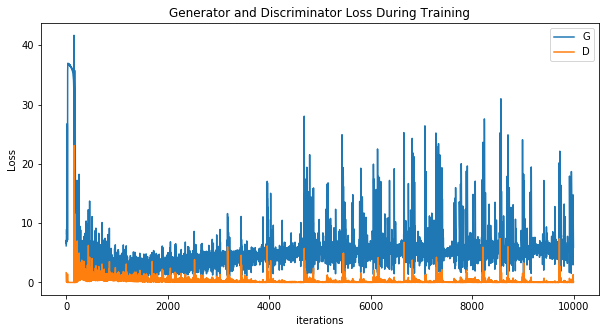

In [15]:
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

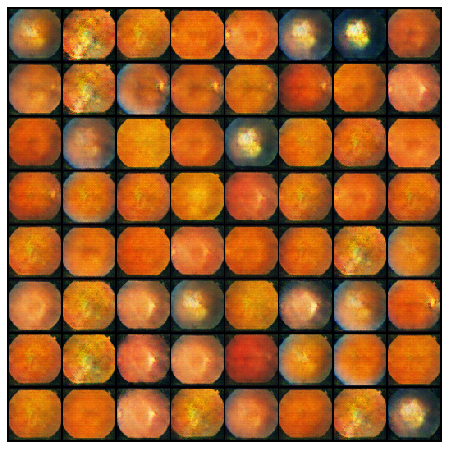

In [16]:
#%%capture
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)]
       for i in img_list]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=1000,
                                repeat_delay=1000,
                                blit=True)
ani.save("anim.mp4")
HTML(ani.to_jshtml())

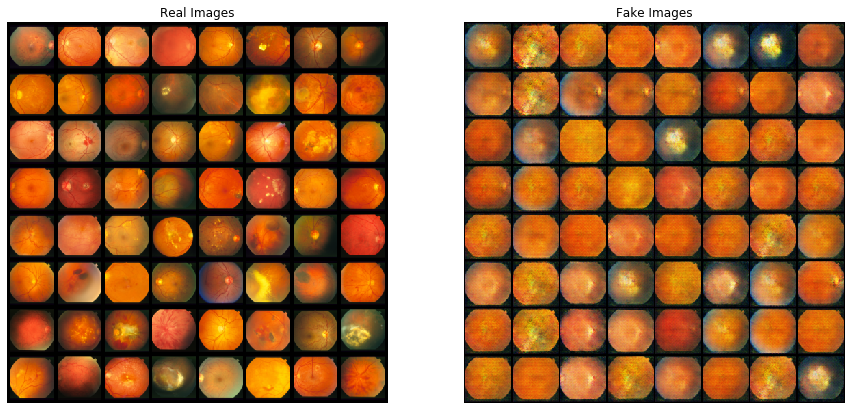

In [17]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch[0].to(device)[:64],
                         padding=5,
                         normalize=True).cpu(), (1, 2, 0)))

# Plot the fake images from the last epoch
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))
plt.show()